# HR Analytics Project
### Understanding the Attrition in HR

Project Description

Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?
HR Analytics
Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.
Attrition in HR
Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.
How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.
Attrition affecting Companies
A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.


importing the required libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

importing the dataset

In [2]:
df=pd.read_csv('hr_attrition.csv')

In [3]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [4]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

We have mainly 2 types of datatype, object and int64 datatype

In [5]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [6]:
df.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


In [7]:
df.sample(6)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1096,40,No,Travel_Rarely,898,Human Resources,6,2,Medical,1,1550,...,4,80,0,21,2,3,21,7,7,7
306,32,No,Travel_Rarely,906,Sales,7,3,Life Sciences,1,420,...,3,80,1,13,3,2,13,8,4,8
363,33,Yes,Travel_Rarely,350,Sales,5,3,Marketing,1,485,...,2,80,0,1,2,3,1,0,0,0
570,52,No,Non-Travel,715,Research & Development,19,4,Medical,1,791,...,1,80,1,5,3,3,4,3,1,2
651,47,No,Travel_Rarely,249,Sales,2,2,Marketing,1,903,...,1,80,1,8,2,3,7,6,7,7
777,21,Yes,Travel_Rarely,1334,Research & Development,10,3,Life Sciences,1,1079,...,1,80,0,1,6,2,1,0,1,0


In [8]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [9]:
df['Age'].unique()

array([41, 49, 37, 33, 27, 32, 59, 30, 38, 36, 35, 29, 31, 34, 28, 22, 53,
       24, 21, 42, 44, 46, 39, 43, 50, 26, 48, 55, 45, 56, 23, 51, 40, 54,
       58, 20, 25, 19, 57, 52, 47, 18, 60], dtype=int64)

In [10]:
df['Age'].nunique()

43

In [11]:
#Target Variable
df['Attrition'].unique()

array(['Yes', 'No'], dtype=object)

In [12]:
df['Attrition'].nunique()

2

In [13]:
df['BusinessTravel'].unique()

array(['Travel_Rarely', 'Travel_Frequently', 'Non-Travel'], dtype=object)

In [14]:
df['BusinessTravel'].nunique()

3

In [15]:
df['DailyRate'].nunique()

886

In [16]:
df['Department'].unique()

array(['Sales', 'Research & Development', 'Human Resources'], dtype=object)

In [17]:
df['Department'].nunique()

3

In [18]:
df['DistanceFromHome'].unique()

array([ 1,  8,  2,  3, 24, 23, 27, 16, 15, 26, 19, 21,  5, 11,  9,  7,  6,
       10,  4, 25, 12, 18, 29, 22, 14, 20, 28, 17, 13], dtype=int64)

In [19]:
df['DistanceFromHome'].nunique()

29

In [20]:
df['EducationField'].nunique()

6

In [21]:
df['EducationField'].unique()

array(['Life Sciences', 'Other', 'Medical', 'Marketing',
       'Technical Degree', 'Human Resources'], dtype=object)

In [22]:
df['PercentSalaryHike'].unique()

array([11, 23, 15, 12, 13, 20, 22, 21, 17, 14, 16, 18, 19, 24, 25],
      dtype=int64)

In [23]:
df['PercentSalaryHike'].nunique()

15

Checking for value counts which will give us the unique values and its count in each each column

In [24]:
for col in df.columns:
    value_counts=df[col].value_counts()
    print('\n')
    print(value_counts)



35    78
34    77
36    69
31    69
29    68
32    61
30    60
33    58
38    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
44    33
46    33
43    32
50    30
25    26
24    26
49    24
47    24
55    22
51    19
53    19
48    19
54    18
52    18
22    16
56    14
23    14
58    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: Age, dtype: int64


No     1233
Yes     237
Name: Attrition, dtype: int64


Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


691     6
408     5
530     5
1329    5
1082    5
       ..
650     1
279     1
316     1
314     1
628     1
Name: DailyRate, Length: 886, dtype: int64


Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


2     211
1     208
10     86
9      85
3      84
7      84
8      80
5      65
4      64
6      59
16     32
11     29
24     28
23    

In [25]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

This dataset has no null values

In [26]:
df.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

This dataset has no nan value

In [27]:
df.max()

Age                                           60
Attrition                                    Yes
BusinessTravel                     Travel_Rarely
DailyRate                                   1499
Department                                 Sales
DistanceFromHome                              29
Education                                      5
EducationField                  Technical Degree
EmployeeCount                                  1
EmployeeNumber                              2068
EnvironmentSatisfaction                        4
Gender                                      Male
HourlyRate                                   100
JobInvolvement                                 4
JobLevel                                       5
JobRole                     Sales Representative
JobSatisfaction                                4
MaritalStatus                             Single
MonthlyIncome                              19999
MonthlyRate                                26999
NumCompaniesWorked  

The maximum value of each variable

In [28]:
df.min()

Age                                                18
Attrition                                          No
BusinessTravel                             Non-Travel
DailyRate                                         102
Department                            Human Resources
DistanceFromHome                                    1
Education                                           1
EducationField                        Human Resources
EmployeeCount                                       1
EmployeeNumber                                      1
EnvironmentSatisfaction                             1
Gender                                         Female
HourlyRate                                         30
JobInvolvement                                      1
JobLevel                                            1
JobRole                     Healthcare Representative
JobSatisfaction                                     1
MaritalStatus                                Divorced
MonthlyIncome               

The minimum value of each variable

In [29]:
df.mean()

Age                            36.923810
DailyRate                     802.485714
DistanceFromHome                9.192517
Education                       2.912925
EmployeeCount                   1.000000
EmployeeNumber               1024.865306
EnvironmentSatisfaction         2.721769
HourlyRate                     65.891156
JobInvolvement                  2.729932
JobLevel                        2.063946
JobSatisfaction                 2.728571
MonthlyIncome                6502.931293
MonthlyRate                 14313.103401
NumCompaniesWorked              2.693197
PercentSalaryHike              15.209524
PerformanceRating               3.153741
RelationshipSatisfaction        2.712245
StandardHours                  80.000000
StockOptionLevel                0.793878
TotalWorkingYears              11.279592
TrainingTimesLastYear           2.799320
WorkLifeBalance                 2.761224
YearsAtCompany                  7.008163
YearsInCurrentRole              4.229252
YearsSinceLastPr

The mean value of each variable

## Exploratory Data Analysis

Univariate Analysis

<AxesSubplot:xlabel='Age', ylabel='Count'>

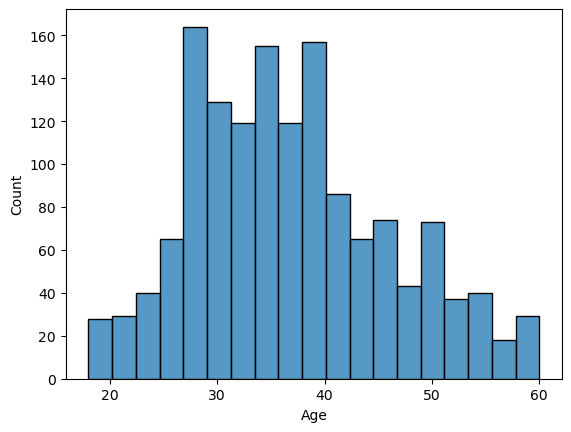

In [30]:
sns.histplot(df['Age'])

60 is the maximum age and 18 is the minimum age here. Also count of 60 y/o and 18 y/o is very low. Persons belonging to 25 to 40 age group has the maximum count

<AxesSubplot:xlabel='DailyRate', ylabel='Count'>

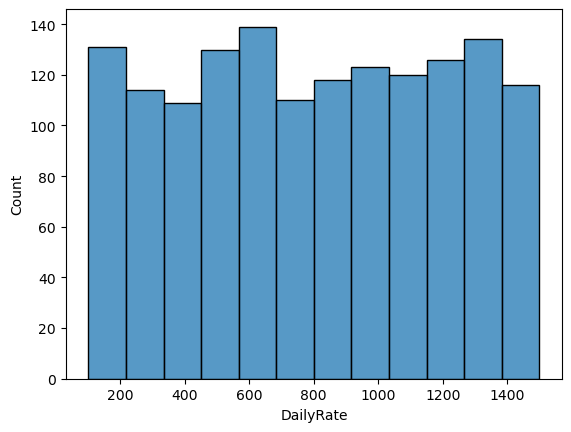

In [31]:
sns.histplot(df['DailyRate'])

<AxesSubplot:xlabel='DistanceFromHome', ylabel='Count'>

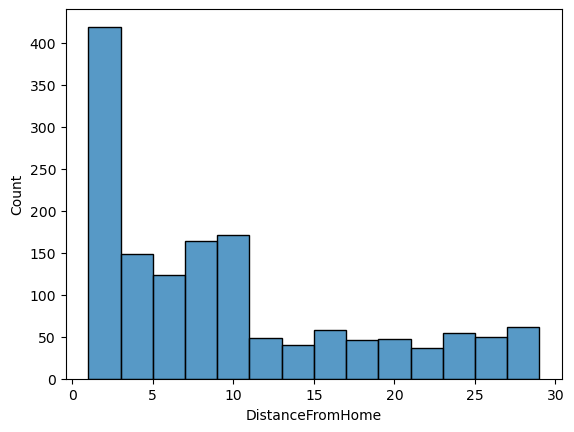

In [32]:
sns.histplot(df['DistanceFromHome'])

3    572
4    398
2    282
1    170
5     48
Name: Education, dtype: int64


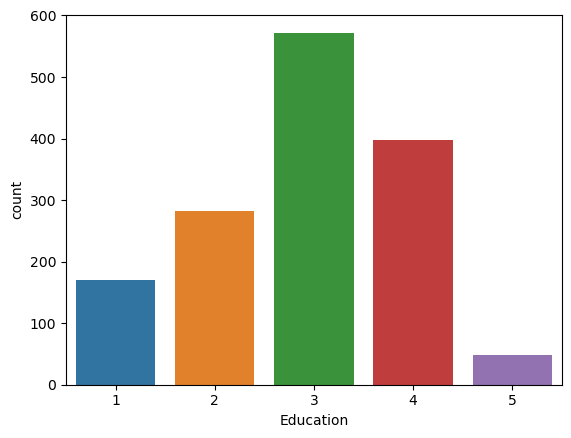

In [33]:
sns.countplot(df['Education'])
print(df['Education'].value_counts())

3    572
4    398
2    282
1    170
5     48
Name: Education, dtype: int64


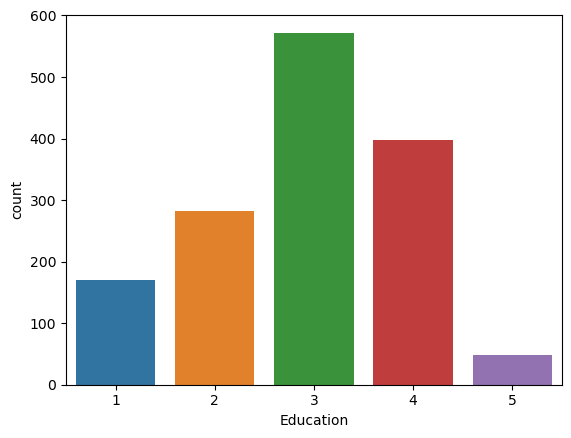

In [34]:
sns.countplot(df['Education'])
print(df['Education'].value_counts())

1    1470
Name: EmployeeCount, dtype: int64


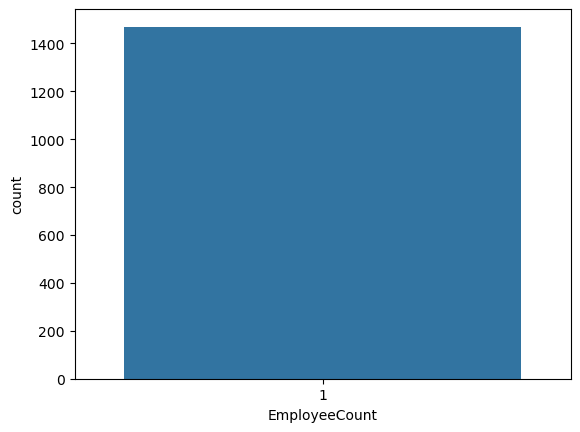

In [35]:
sns.countplot(df['EmployeeCount'])
print(df['EmployeeCount'].value_counts())

<AxesSubplot:xlabel='EmployeeNumber', ylabel='Count'>

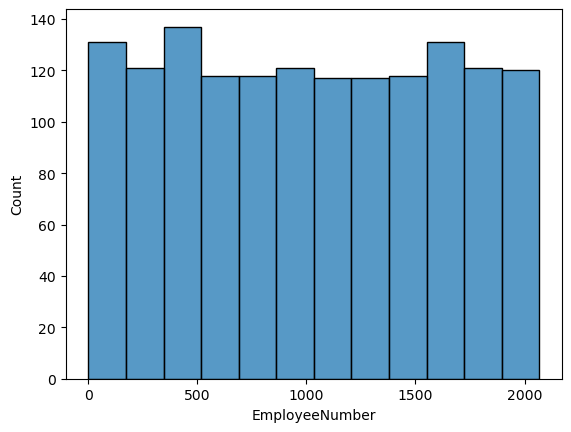

In [36]:
sns.histplot(df['EmployeeNumber'])

3    453
4    446
2    287
1    284
Name: EnvironmentSatisfaction, dtype: int64


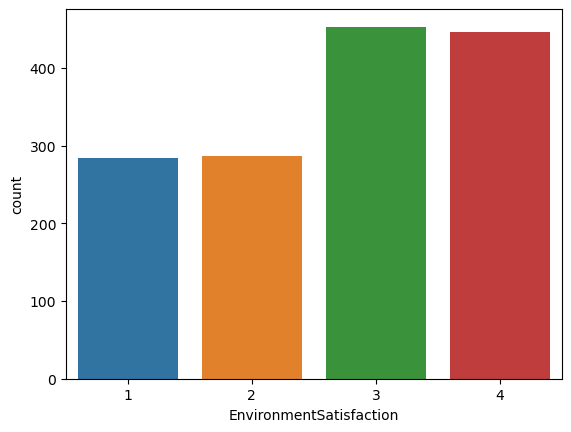

In [37]:
sns.countplot(df['EnvironmentSatisfaction'])
print(df['EnvironmentSatisfaction'].value_counts())

66    29
98    28
42    28
48    28
84    28
      ..
31    15
53    14
68    14
38    13
34    12
Name: HourlyRate, Length: 71, dtype: int64


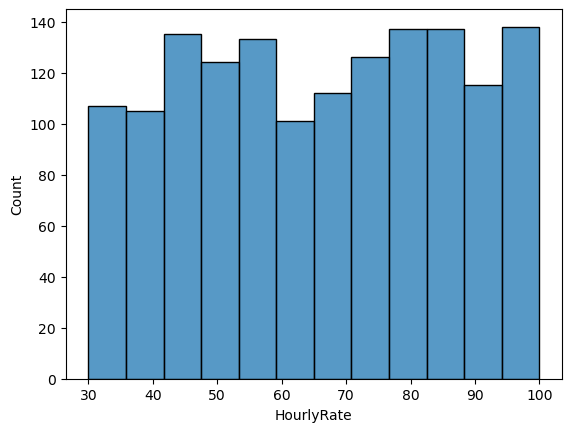

In [38]:
sns.histplot(df['HourlyRate'])
print(df['HourlyRate'].value_counts())

3    868
2    375
4    144
1     83
Name: JobInvolvement, dtype: int64


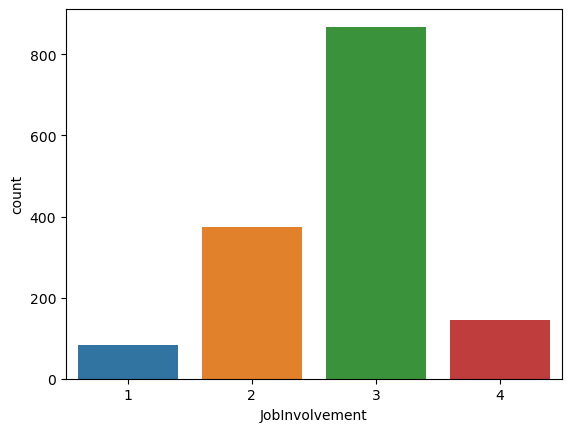

In [39]:
sns.countplot(df['JobInvolvement'])
print(df['JobInvolvement'].value_counts())

1    543
2    534
3    218
4    106
5     69
Name: JobLevel, dtype: int64


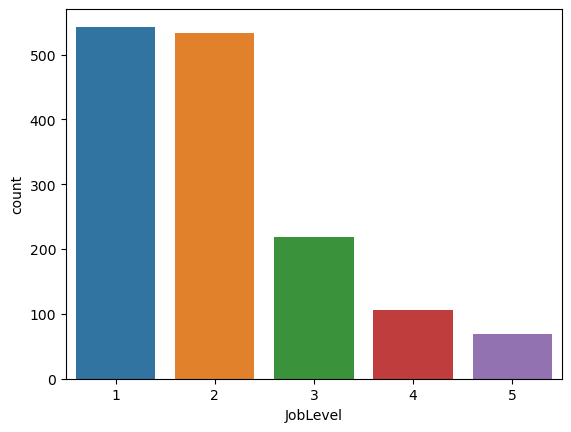

In [40]:
sns.countplot(df['JobLevel'])
print(df['JobLevel'].value_counts())

4    459
3    442
1    289
2    280
Name: JobSatisfaction, dtype: int64


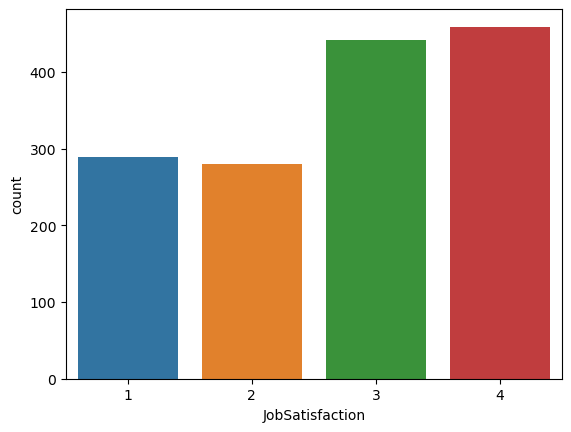

In [41]:
sns.countplot(df['JobSatisfaction'])
print(df['JobSatisfaction'].value_counts())

<AxesSubplot:xlabel='MonthlyIncome', ylabel='Count'>

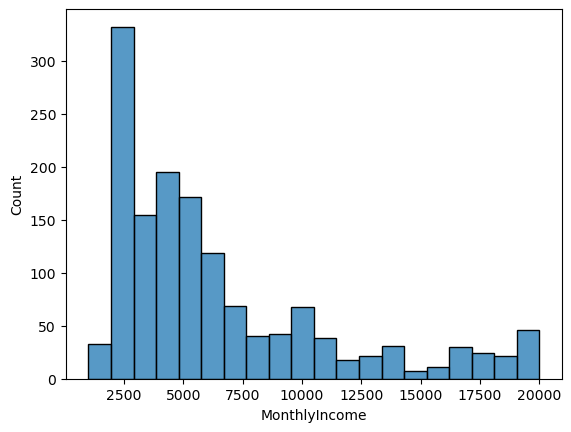

In [42]:
sns.histplot(df['MonthlyIncome'])

<AxesSubplot:xlabel='MonthlyRate', ylabel='Count'>

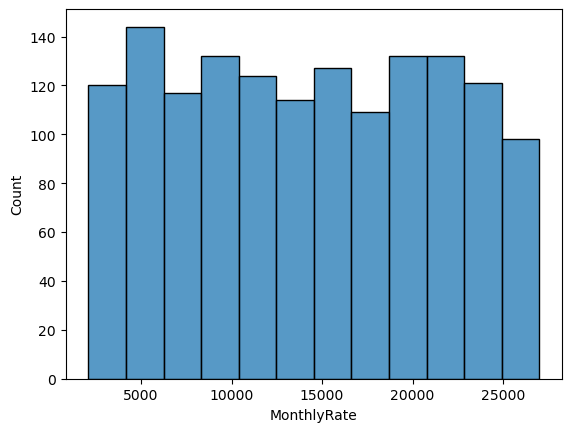

In [43]:
sns.histplot(df['MonthlyRate'])


1    521
0    197
3    159
2    146
4    139
7     74
6     70
5     63
9     52
8     49
Name: NumCompaniesWorked, dtype: int64


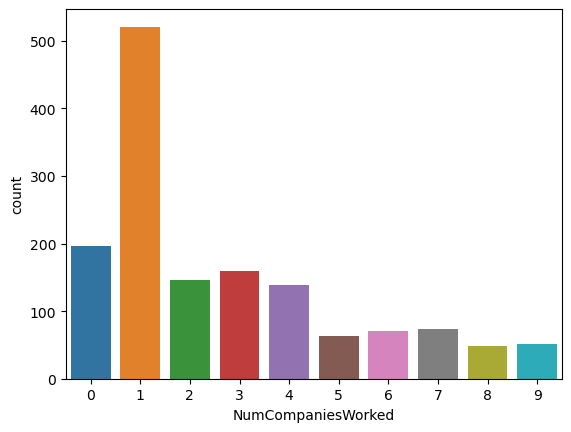

In [44]:
sns.countplot(df['NumCompaniesWorked'])
print(df['NumCompaniesWorked'].value_counts())

No     1233
Yes     237
Name: Attrition, dtype: int64


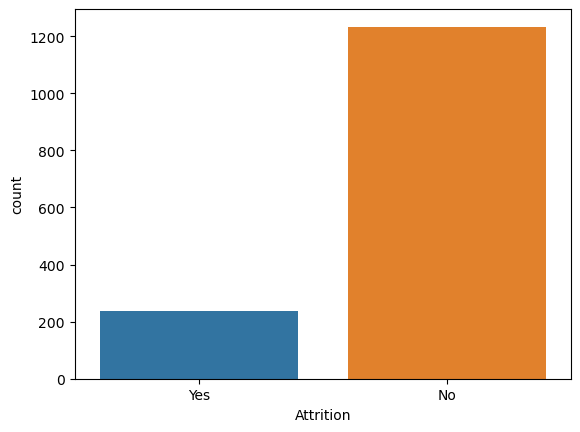

In [46]:
sns.countplot(df['Attrition'])
print(df['Attrition'].value_counts())

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


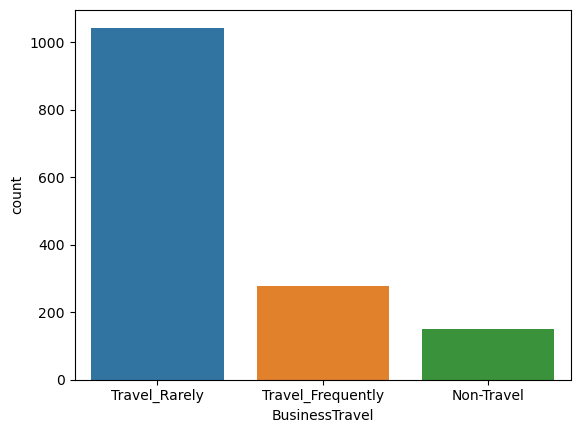

In [47]:
sns.countplot(df['BusinessTravel'])
print(df['BusinessTravel'].value_counts())

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


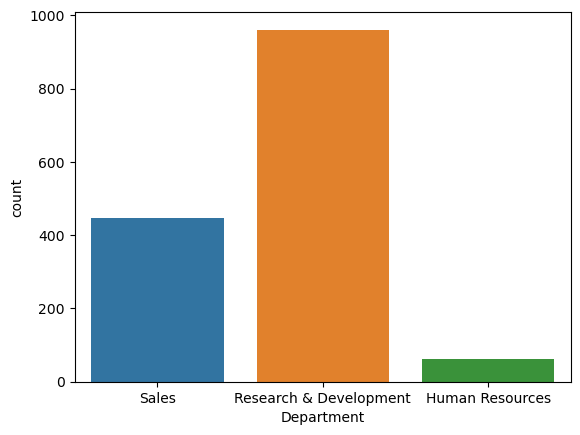

In [48]:
sns.countplot(df['Department'])
print(df['Department'].value_counts())

Male      882
Female    588
Name: Gender, dtype: int64


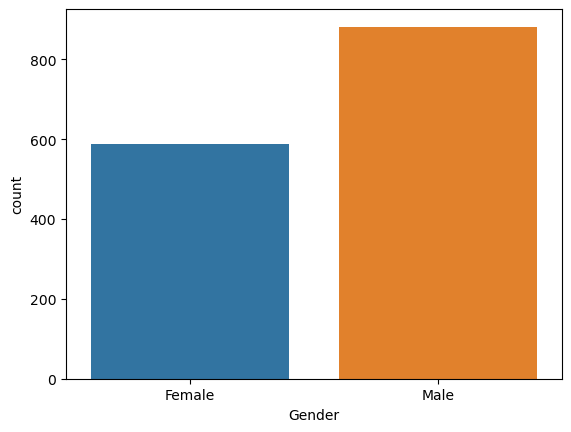

In [49]:
sns.countplot(df['Gender'])
print(df['Gender'].value_counts())

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64


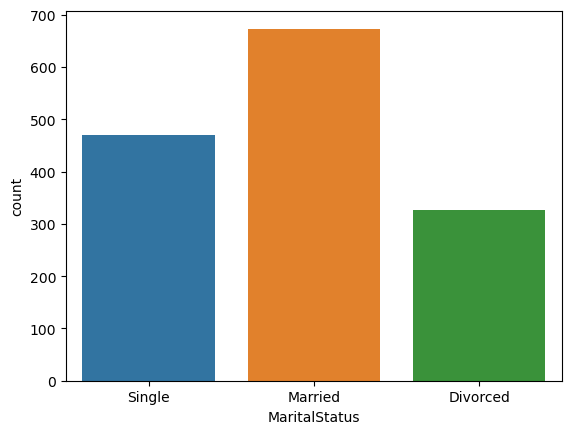

In [50]:
sns.countplot(df['MaritalStatus'])
print(df['MaritalStatus'].value_counts())

<AxesSubplot:xlabel='MonthlyIncome', ylabel='Count'>

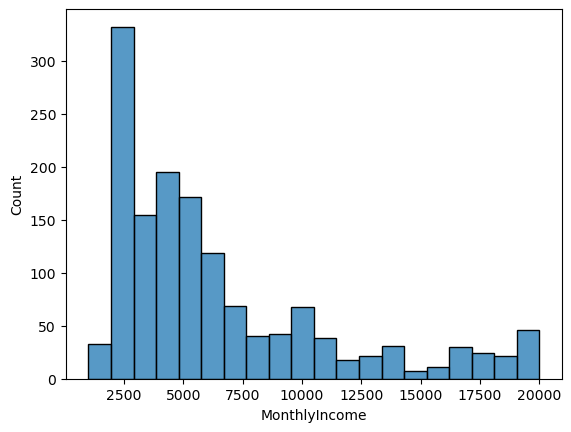

In [51]:
sns.histplot(df['MonthlyIncome'])

<AxesSubplot:xlabel='MonthlyRate', ylabel='Count'>

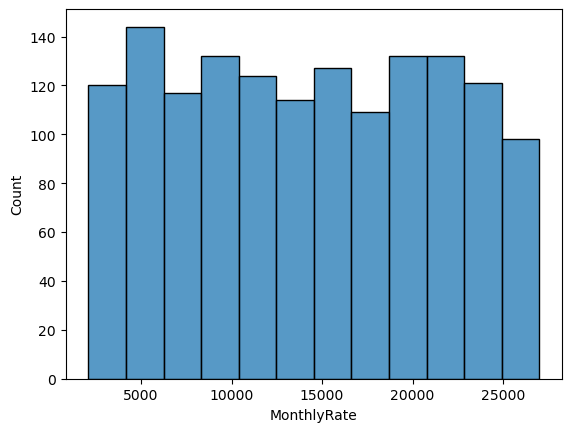

In [52]:
sns.histplot(df['MonthlyRate'])

1    521
0    197
3    159
2    146
4    139
7     74
6     70
5     63
9     52
8     49
Name: NumCompaniesWorked, dtype: int64


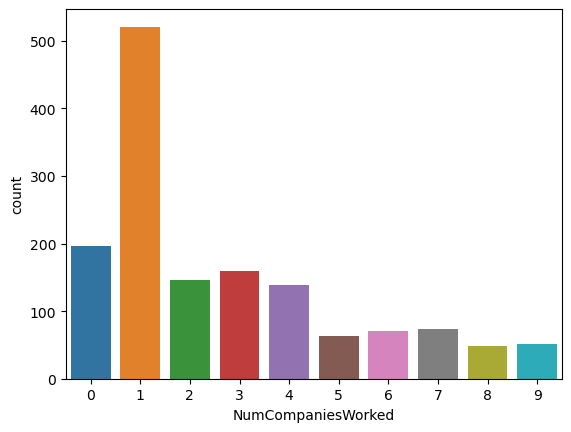

In [53]:
sns.countplot(df['NumCompaniesWorked'])
print(df['NumCompaniesWorked'].value_counts())

Y    1470
Name: Over18, dtype: int64


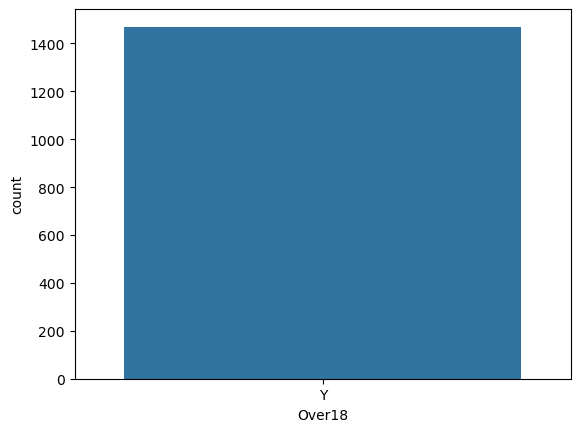

In [54]:
sns.countplot(df['Over18'])
print(df['Over18'].value_counts())

No     1054
Yes     416
Name: OverTime, dtype: int64


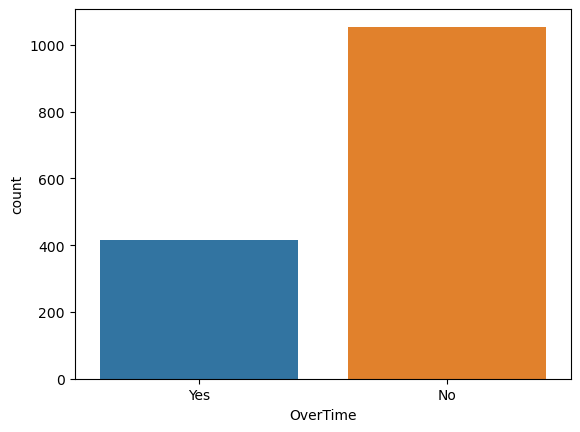

In [55]:
sns.countplot(df['OverTime'])
print(df['OverTime'].value_counts())

11    210
13    209
14    201
12    198
15    101
18     89
17     82
16     78
19     76
22     56
20     55
21     48
23     28
24     21
25     18
Name: PercentSalaryHike, dtype: int64


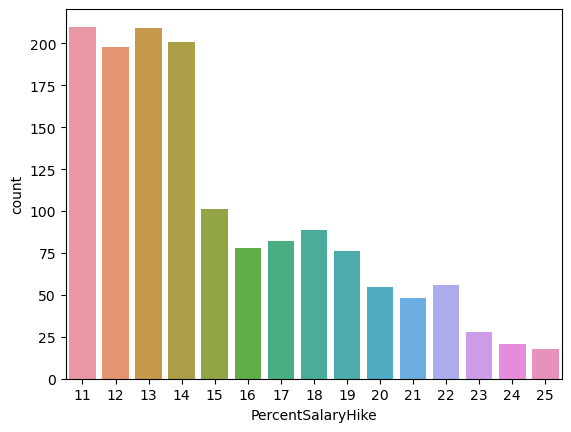

In [56]:
sns.countplot(df['PercentSalaryHike'])
print(df['PercentSalaryHike'].value_counts())

3    1244
4     226
Name: PerformanceRating, dtype: int64


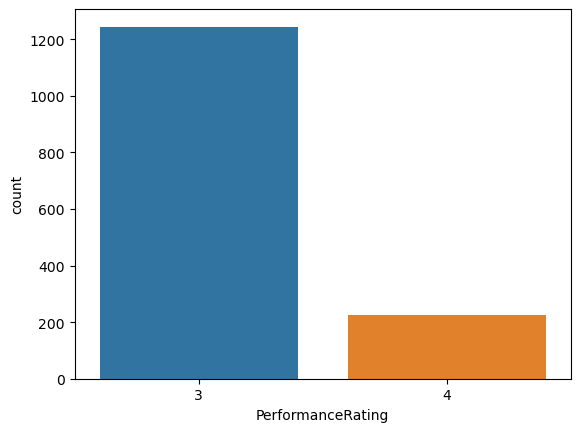

In [57]:
sns.countplot(df['PerformanceRating'])
print(df['PerformanceRating'].value_counts())

3    459
4    432
2    303
1    276
Name: RelationshipSatisfaction, dtype: int64


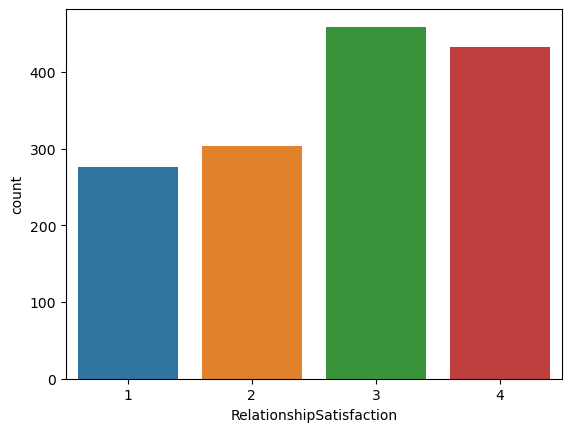

In [58]:
sns.countplot(df['RelationshipSatisfaction'])
print(df['RelationshipSatisfaction'].value_counts())

<AxesSubplot:xlabel='StandardHours', ylabel='count'>

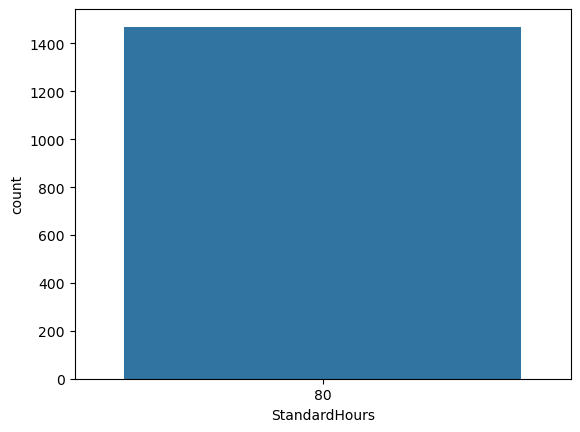

In [59]:
sns.countplot(df['StandardHours'])

0    631
1    596
2    158
3     85
Name: StockOptionLevel, dtype: int64


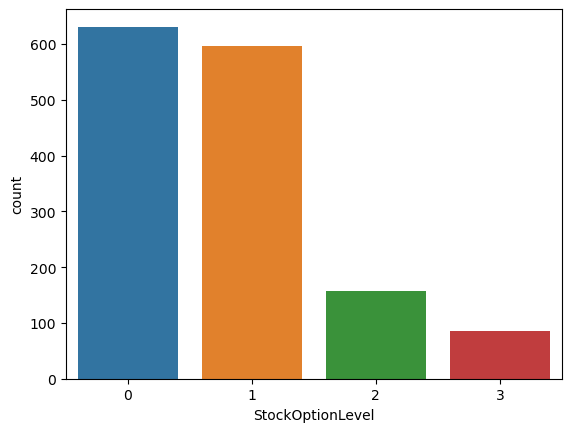

In [60]:
sns.countplot(df['StockOptionLevel'])
print(df['StockOptionLevel'].value_counts())

<AxesSubplot:xlabel='TotalWorkingYears', ylabel='Count'>

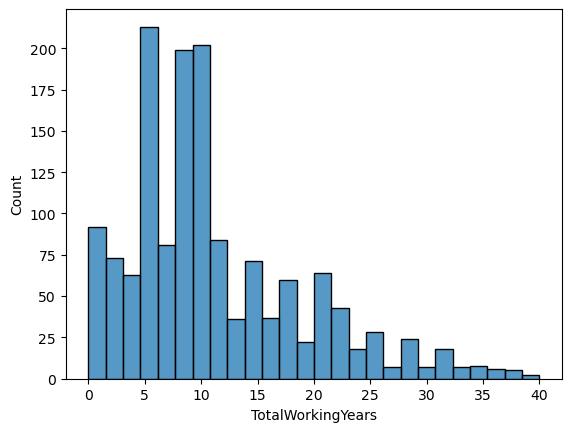

In [61]:
sns.histplot(df['TotalWorkingYears'])

2    547
3    491
4    123
5    119
1     71
6     65
0     54
Name: TrainingTimesLastYear, dtype: int64


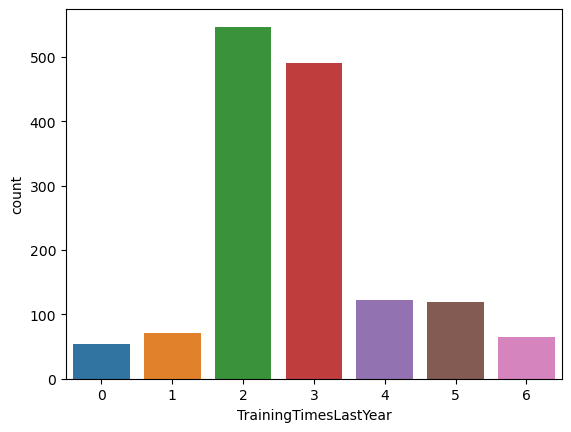

In [62]:
sns.countplot(df['TrainingTimesLastYear'])
print(df['TrainingTimesLastYear'].value_counts())

3    893
2    344
4    153
1     80
Name: WorkLifeBalance, dtype: int64


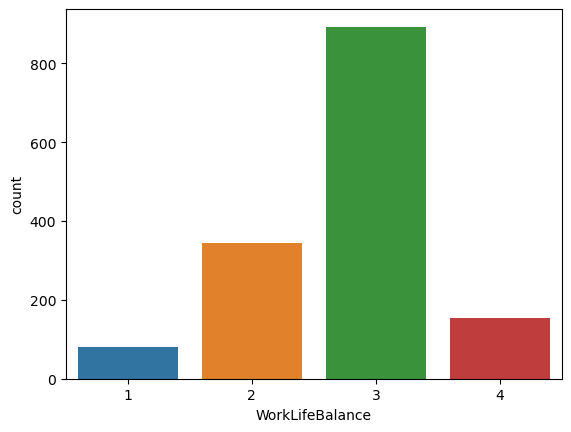

In [63]:
sns.countplot(df['WorkLifeBalance'])
print(df['WorkLifeBalance'].value_counts())

<AxesSubplot:xlabel='YearsAtCompany', ylabel='Count'>

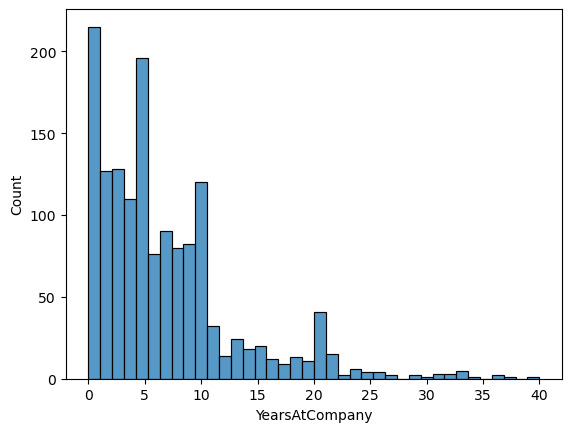

In [64]:
sns.histplot(df['YearsAtCompany'])

<AxesSubplot:xlabel='YearsInCurrentRole', ylabel='Count'>

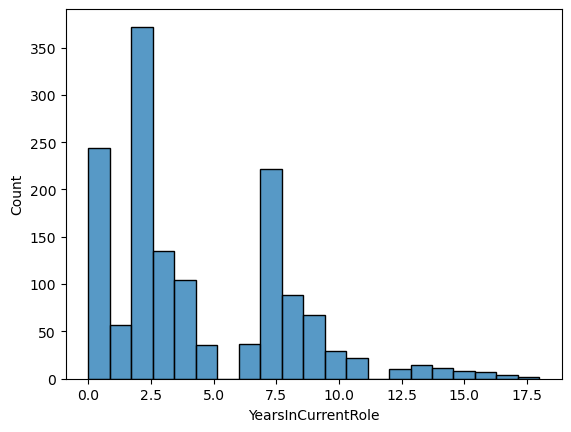

In [65]:
sns.histplot(df['YearsInCurrentRole'])

<AxesSubplot:xlabel='YearsSinceLastPromotion', ylabel='Count'>

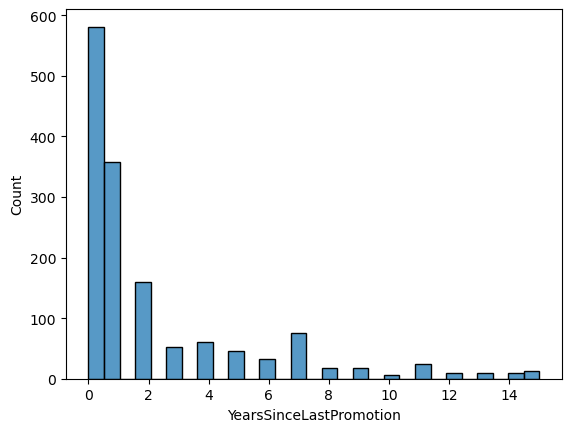

In [66]:
sns.histplot(df['YearsSinceLastPromotion'])

<AxesSubplot:xlabel='YearsWithCurrManager', ylabel='Count'>

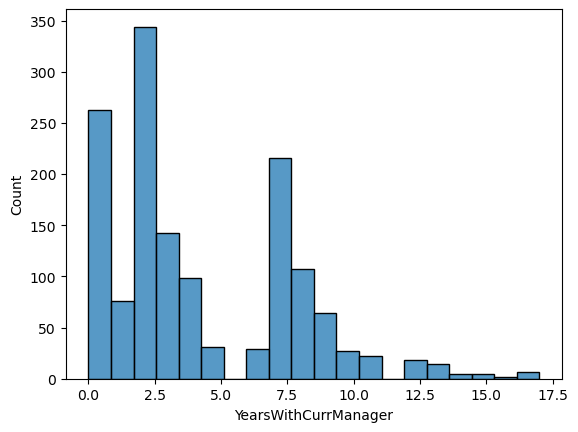

In [67]:
sns.histplot(df['YearsWithCurrManager'])

Bivariate Analysis

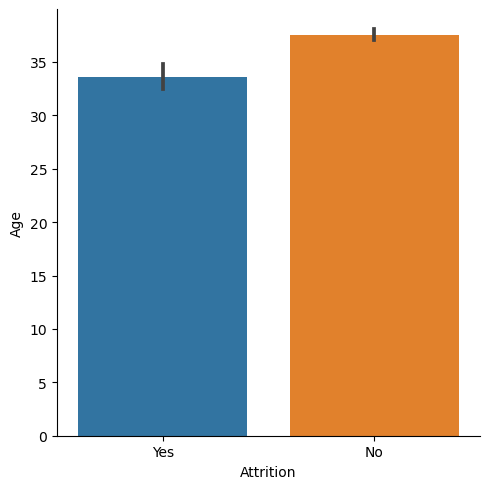

In [68]:
sns.catplot(x='Attrition',y='Age',data=df,kind='bar')

In [ ]:
It 

In [69]:
df['Age'].describe()

count    1470.000000
mean       36.923810
std         9.135373
min        18.000000
25%        30.000000
50%        36.000000
75%        43.000000
max        60.000000
Name: Age, dtype: float64

From the data it is visible that the minimum age is 18 and the maximum age is 60. So if we convert this numerical data into categorical data we can get better insight of the data.

SO lets convert the age into: 18yrs-35 yrs as Adult , 36yrs-50yrs as senior adult and 51yrs to 60yrs as Elder

In [70]:
df['age_cat']=np.NaN
lst=[df]

for col in lst:
    col.loc[(col['Age']>=18)&(col['Age']<=35),'age_cat']='Adult'
    col.loc[(col['Age']>=36)&(col['Age']<=50),'age_cat']='Senior Adult'
    col.loc[(col['Age']>=51)&(col['Age']<=60),'age_cat']='Elder'

In [265]:
lst

[      Attrition  BusinessTravel  DailyRate  Department  DistanceFromHome  \
 0             1               2       1102           2                 1   
 1             0               1        279           1                 8   
 2             1               2       1373           1                 2   
 3             0               1       1392           1                 3   
 4             0               2        591           1                 2   
 ...         ...             ...        ...         ...               ...   
 1465          0               1        884           1                23   
 1466          0               2        613           1                 6   
 1467          0               2        155           1                 4   
 1468          0               1       1023           2                 2   
 1469          0               2        628           1                 8   
 
       Education  EducationField  EmployeeCount  EmployeeNumber  \
 0     

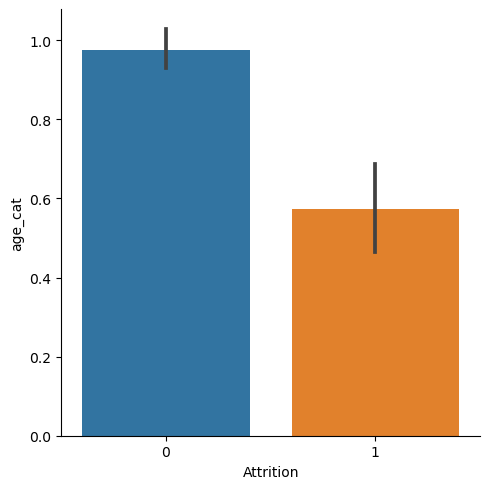

In [266]:
sns.catplot(x='Attrition',y='age_cat',data=df,kind='bar')

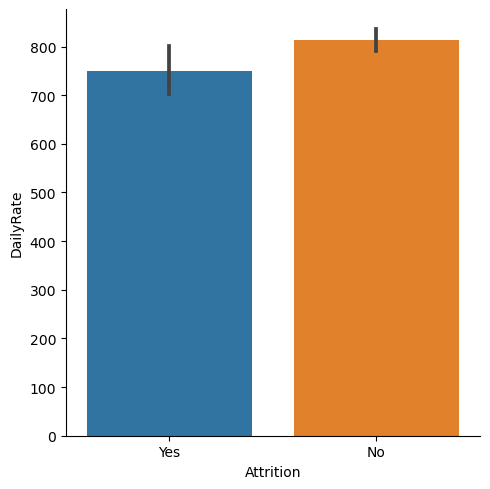

In [73]:
sns.catplot(x='Attrition',y='DailyRate',data=df,kind='bar')

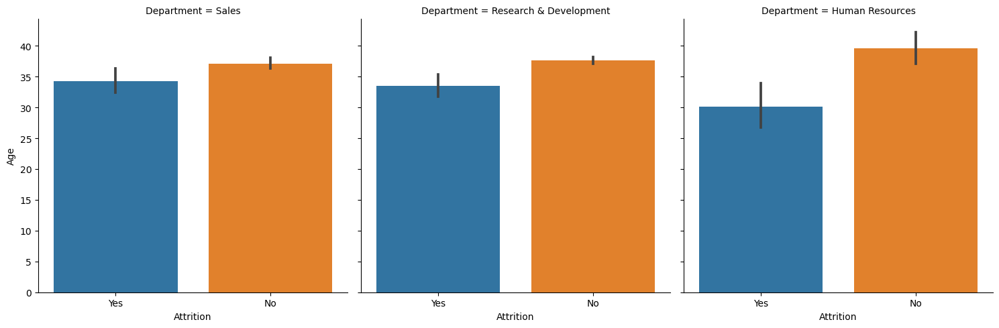

In [74]:
sns.catplot(x='Attrition',y='Age',col='Department',data=df,kind='bar')

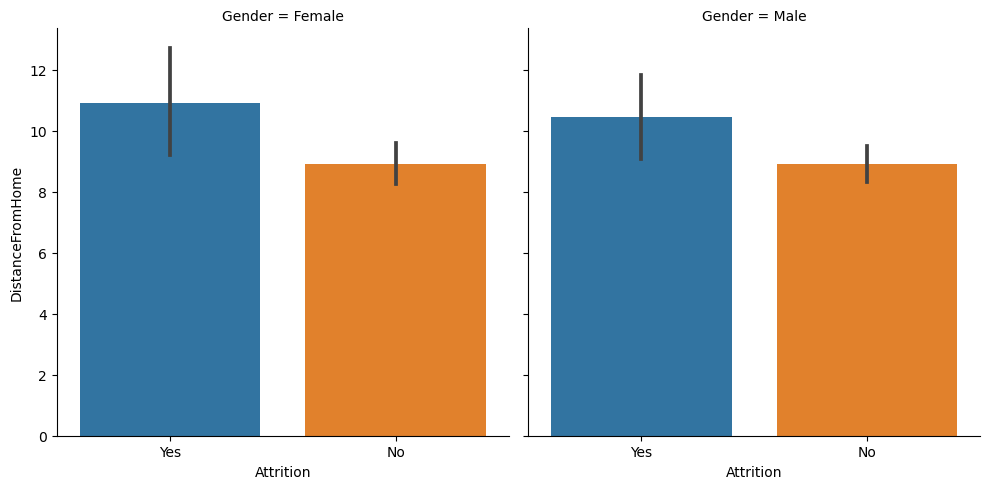

In [75]:
sns.catplot(x='Attrition',y='DistanceFromHome',col='Gender',data=df,kind='bar')

Female candidate who live far from office has more chances of attrition and same for male candidate.

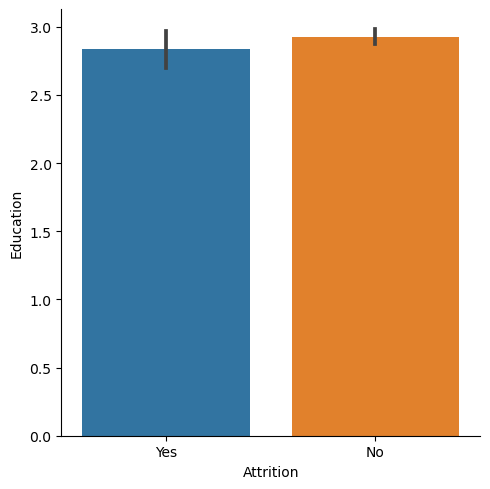

In [76]:
sns.catplot(x='Attrition',y='Education',data=df,kind='bar')

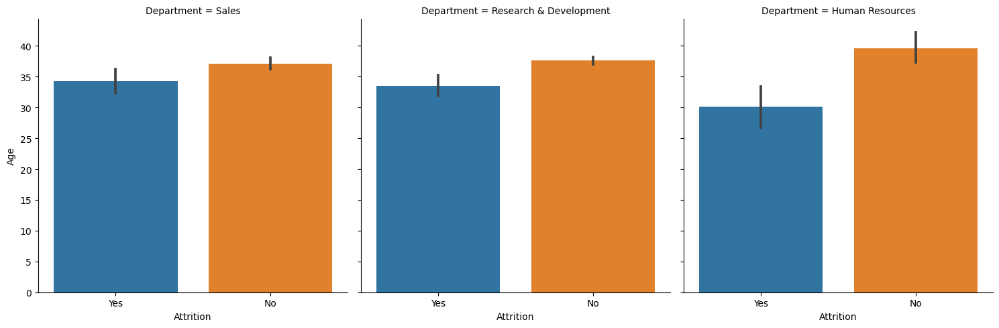

In [77]:
sns.catplot(x='Attrition',y='Age',col='Department',data=df,kind='bar')

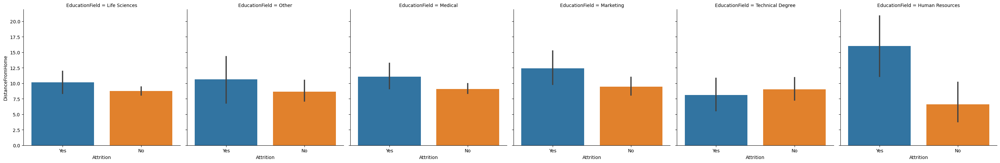

In [78]:
sns.catplot(x='Attrition',y='DistanceFromHome',col='EducationField',data=df,kind='bar')

<AxesSubplot:xlabel='DistanceFromHome', ylabel='count'>

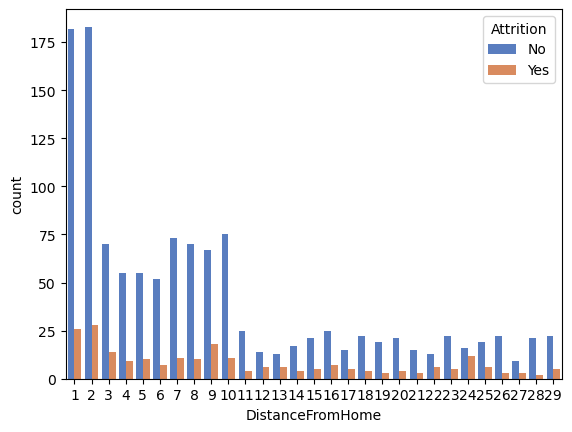

In [79]:
sns.countplot(x='DistanceFromHome',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

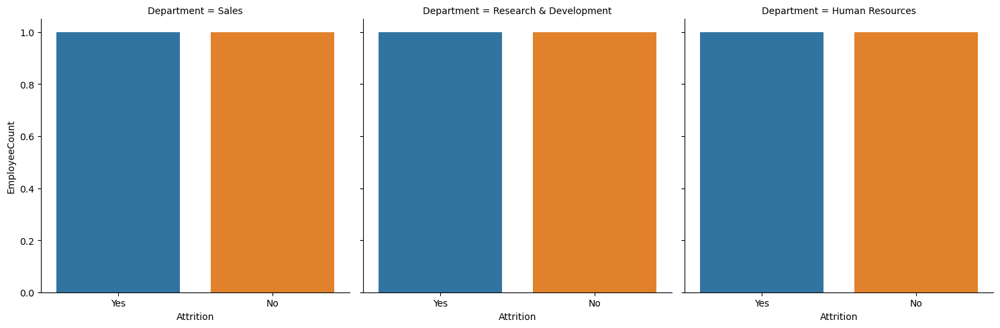

In [80]:
sns.catplot(x='Attrition',y='EmployeeCount',col='Department',data=df,kind='bar')

<AxesSubplot:xlabel='EmployeeCount', ylabel='count'>

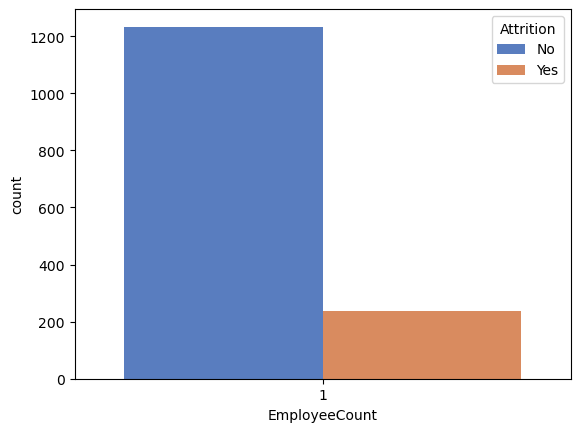

In [81]:
sns.countplot(x='EmployeeCount',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

But if we compare total no of employee who resigned from office with who hasnot its very less

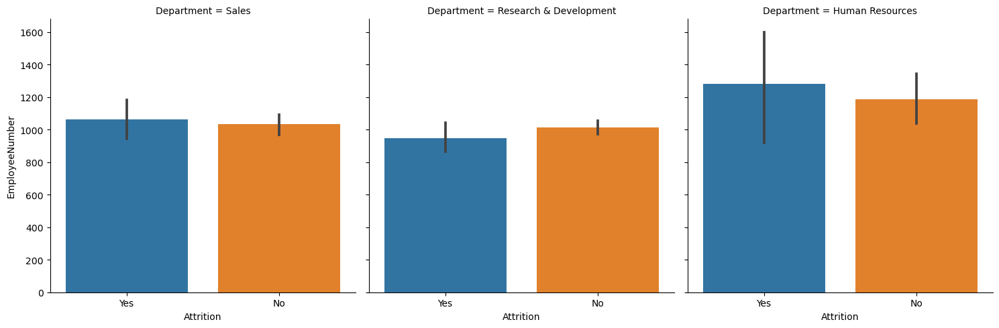

In [82]:
sns.catplot(x='Attrition',y='EmployeeNumber',col='Department',data=df,kind='bar')

<AxesSubplot:xlabel='Department', ylabel='count'>

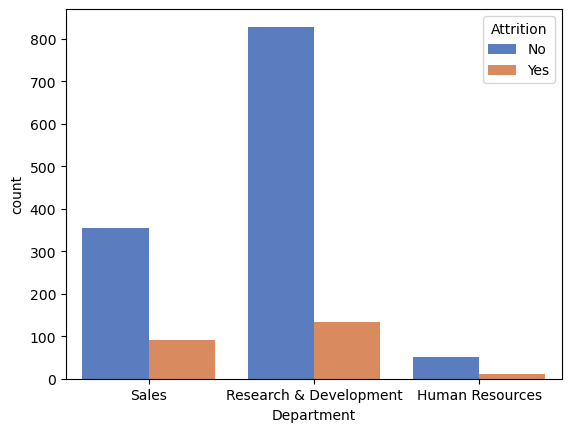

In [83]:
sns.countplot(x='Department',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

Its noticed that employees who work at R & D has resigned more as compared to Sales and human resource

<AxesSubplot:xlabel='JobSatisfaction', ylabel='count'>

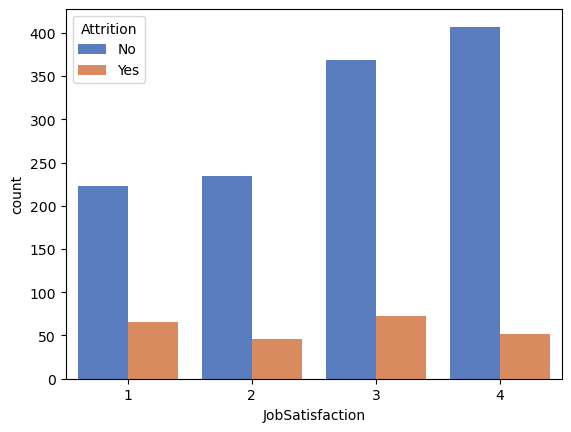

In [84]:
sns.countplot(x='JobSatisfaction',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

Its noticed that employees with less job satisfaction has resigned more as compared to Satisfied employee

<AxesSubplot:xlabel='JobRole', ylabel='count'>

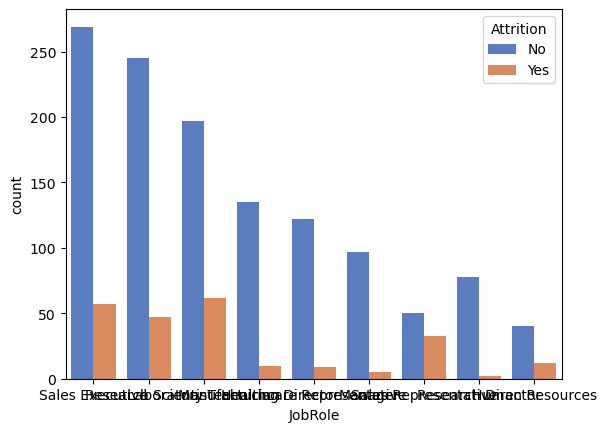

In [85]:
sns.countplot(x='JobRole',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='JobLevel', ylabel='count'>

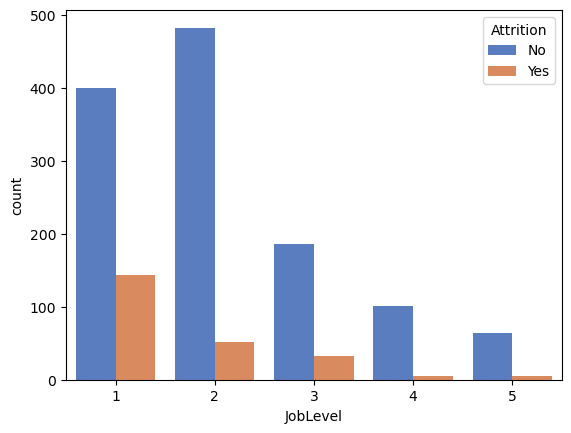

In [86]:
sns.countplot(x='JobLevel',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='JobInvolvement', ylabel='count'>

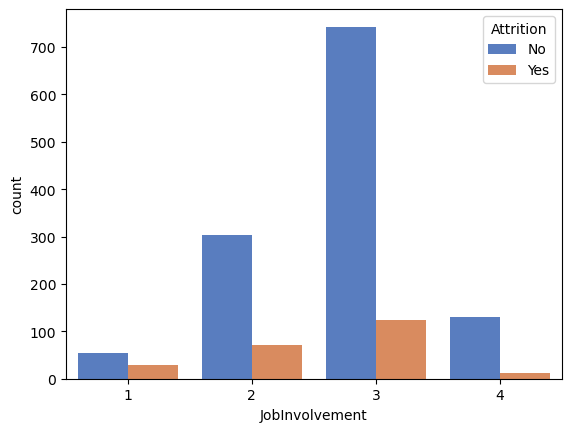

In [87]:
sns.countplot(x='JobInvolvement',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='MaritalStatus', ylabel='count'>

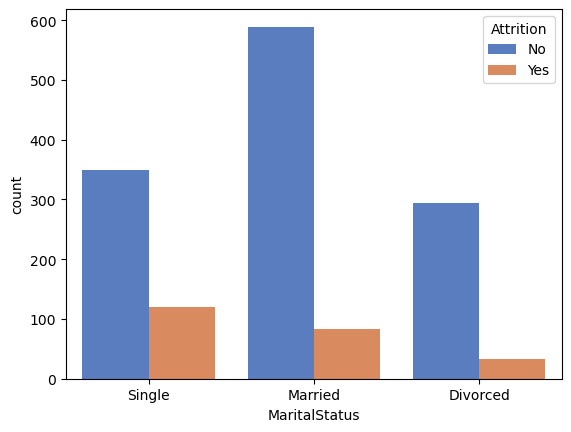

In [88]:
sns.countplot(x='MaritalStatus',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

Its noticed that people who are single as compared to married and divorced have left more

<AxesSubplot:xlabel='MonthlyRate', ylabel='count'>

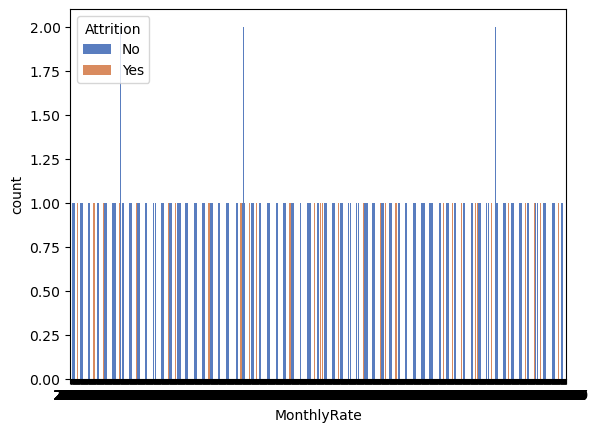

In [89]:
sns.countplot(x='MonthlyRate',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='NumCompaniesWorked', ylabel='count'>

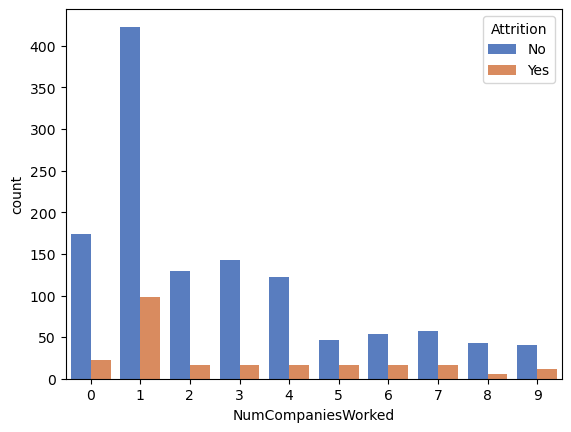

In [90]:
sns.countplot(x='NumCompaniesWorked',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='Over18', ylabel='count'>

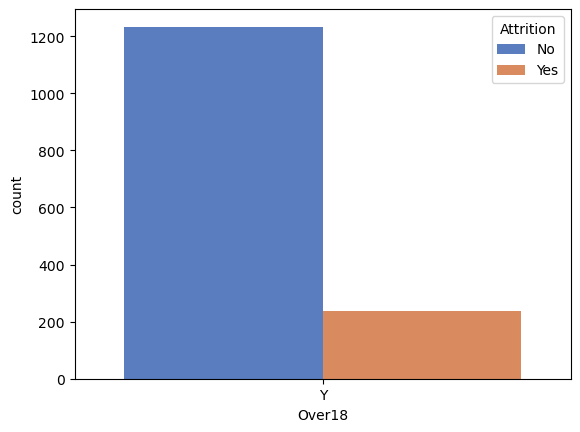

In [91]:
sns.countplot(x='Over18',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

People who are aged more than 18 years have stayed in their job

<AxesSubplot:xlabel='OverTime', ylabel='count'>

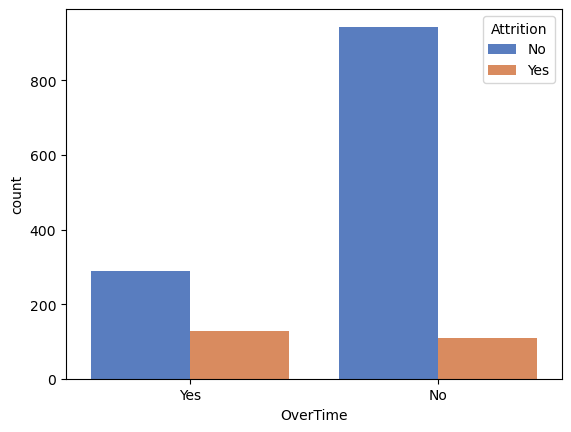

In [92]:
sns.countplot(x='OverTime',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

Its noticed that both people who worked overtime or not but attrition rate is same in both the case

<AxesSubplot:xlabel='PercentSalaryHike', ylabel='count'>

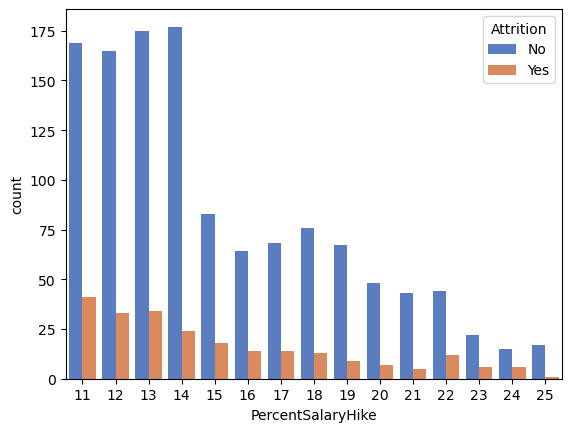

In [93]:
sns.countplot(x='PercentSalaryHike',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='PerformanceRating', ylabel='count'>

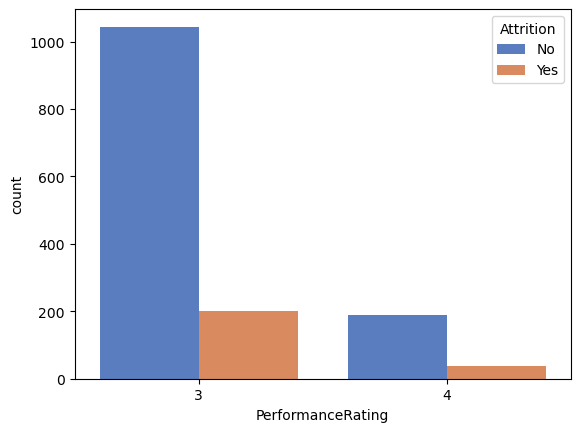

In [94]:
sns.countplot(x='PerformanceRating',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='RelationshipSatisfaction', ylabel='count'>

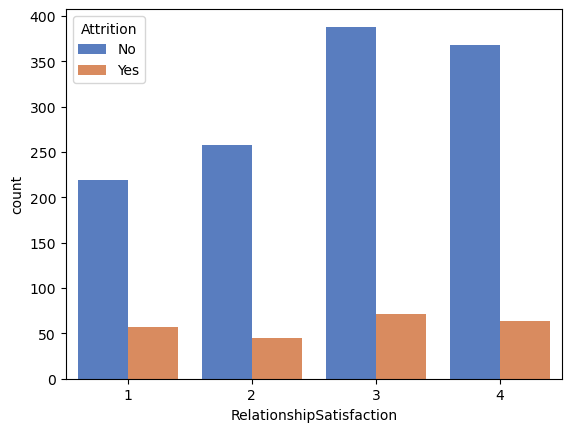

In [95]:
sns.countplot(x='RelationshipSatisfaction',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='StandardHours', ylabel='count'>

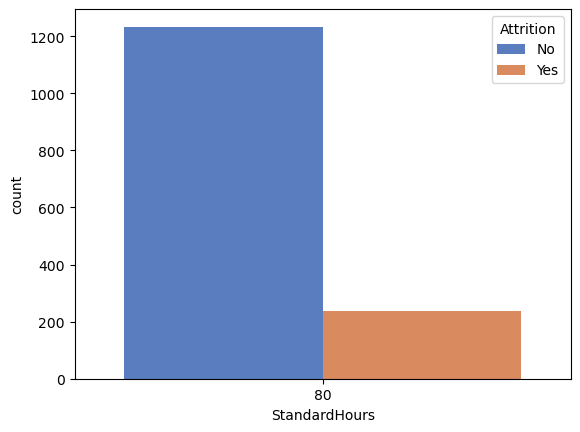

In [96]:
sns.countplot(x='StandardHours',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='StockOptionLevel', ylabel='count'>

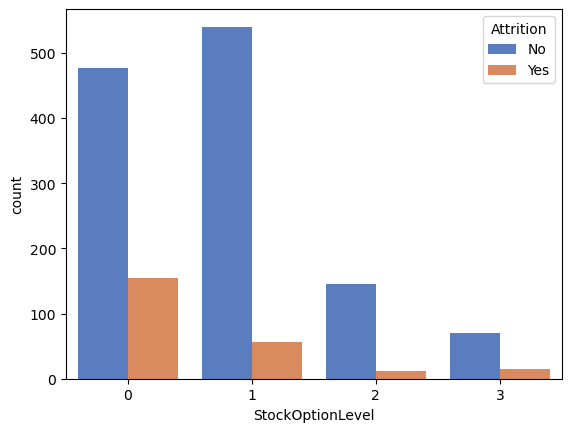

In [97]:
sns.countplot(x='StockOptionLevel',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='TotalWorkingYears', ylabel='count'>

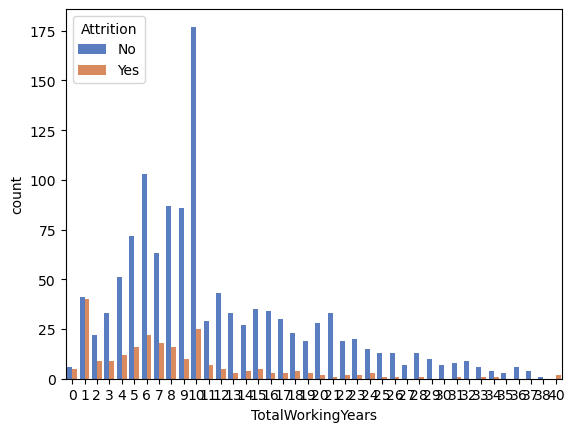

In [98]:
sns.countplot(x='TotalWorkingYears',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='TrainingTimesLastYear', ylabel='count'>

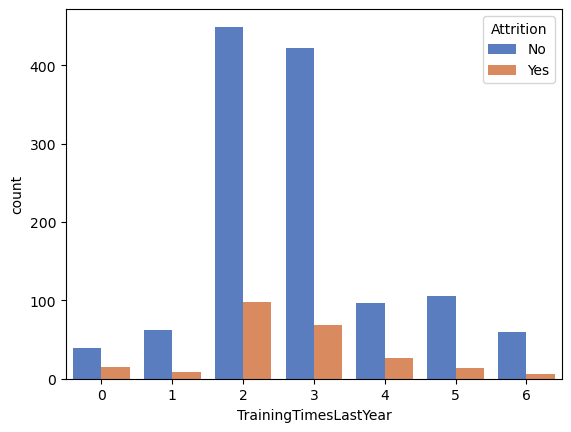

In [99]:
sns.countplot(x='TrainingTimesLastYear',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

In [100]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'age_cat'],
      dtype='object')

<AxesSubplot:xlabel='WorkLifeBalance', ylabel='count'>

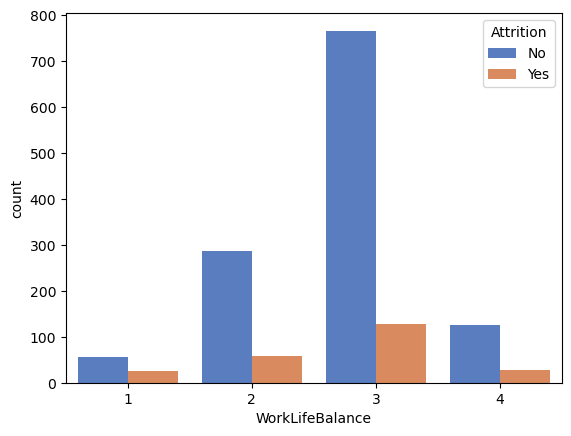

In [101]:
sns.countplot(x='WorkLifeBalance',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='YearsAtCompany', ylabel='count'>

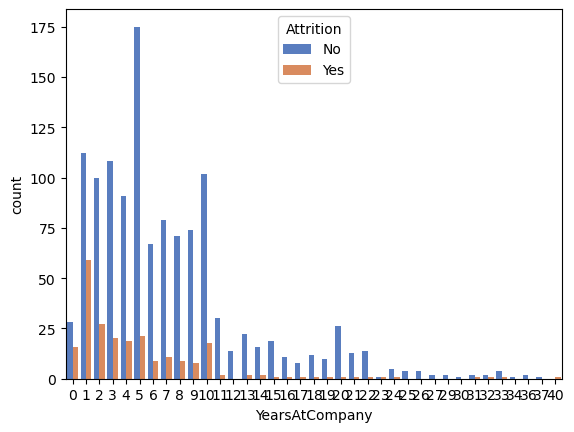

In [102]:
sns.countplot(x='YearsAtCompany',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='YearsInCurrentRole', ylabel='count'>

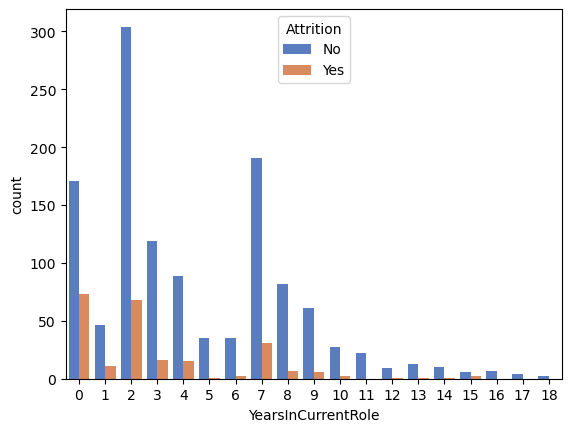

In [103]:
sns.countplot(x='YearsInCurrentRole',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='YearsSinceLastPromotion', ylabel='count'>

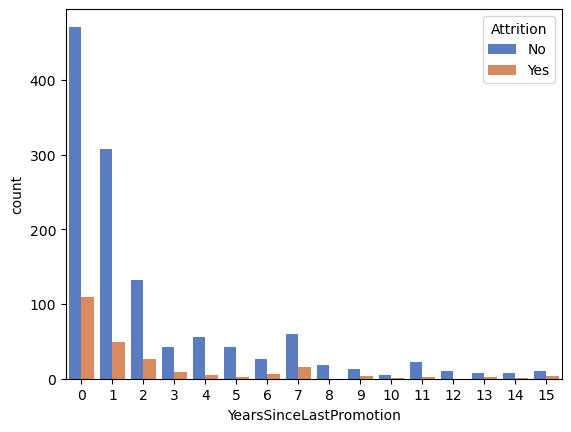

In [104]:
sns.countplot(x='YearsSinceLastPromotion',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

<AxesSubplot:xlabel='YearsWithCurrManager', ylabel='count'>

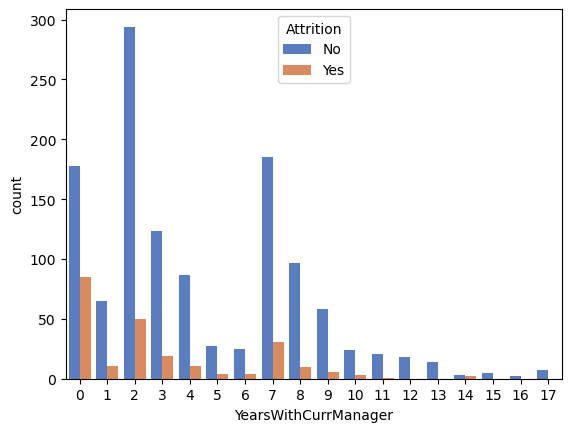

In [105]:
sns.countplot(x='YearsWithCurrManager',hue='Attrition',data=df,hue_order=['No', 'Yes'], palette='muted')

Multivariate Analysis

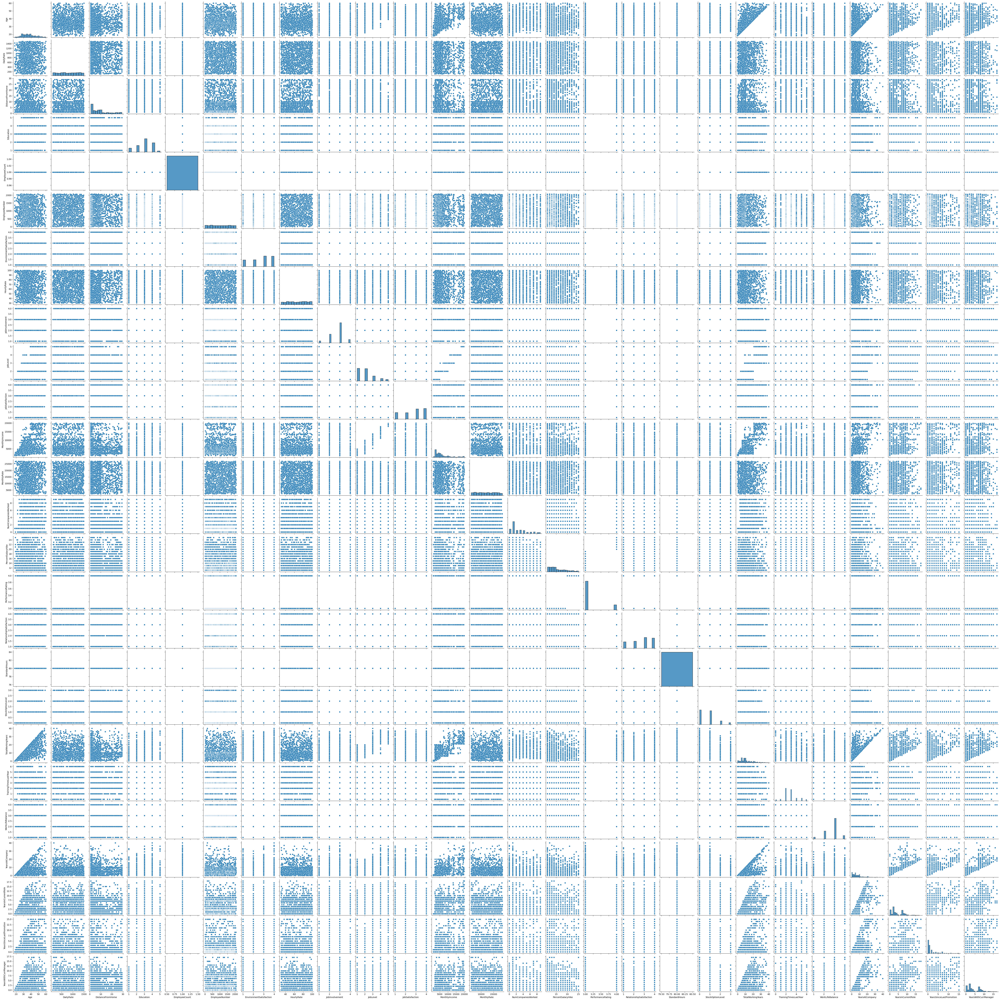

In [106]:
sns.pairplot(df)

## Encoding Categorical Columns

In [109]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [110]:
df.drop('Age',axis=1,inplace=True)

We have Attrition, BusinessTravel, Department, EducationField, Gender, JobRole, MaritalStatus, Over18, OverTime, age_cat

In [111]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Attrition                 1470 non-null   object
 1   BusinessTravel            1470 non-null   object
 2   DailyRate                 1470 non-null   int64 
 3   Department                1470 non-null   object
 4   DistanceFromHome          1470 non-null   int64 
 5   Education                 1470 non-null   int64 
 6   EducationField            1470 non-null   object
 7   EmployeeCount             1470 non-null   int64 
 8   EmployeeNumber            1470 non-null   int64 
 9   EnvironmentSatisfaction   1470 non-null   int64 
 10  Gender                    1470 non-null   object
 11  HourlyRate                1470 non-null   int64 
 12  JobInvolvement            1470 non-null   int64 
 13  JobLevel                  1470 non-null   int64 
 14  JobRole                 

In [112]:
from sklearn.preprocessing import LabelEncoder
categorical_cols = df.select_dtypes(include=['object']).columns
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

In [113]:
df.dtypes

Attrition                   int32
BusinessTravel              int32
DailyRate                   int64
Department                  int32
DistanceFromHome            int64
Education                   int64
EducationField              int32
EmployeeCount               int64
EmployeeNumber              int64
EnvironmentSatisfaction     int64
Gender                      int32
HourlyRate                  int64
JobInvolvement              int64
JobLevel                    int64
JobRole                     int32
JobSatisfaction             int64
MaritalStatus               int32
MonthlyIncome               int64
MonthlyRate                 int64
NumCompaniesWorked          int64
Over18                      int32
OverTime                    int32
PercentSalaryHike           int64
PerformanceRating           int64
RelationshipSatisfaction    int64
StandardHours               int64
StockOptionLevel            int64
TotalWorkingYears           int64
TrainingTimesLastYear       int64
WorkLifeBalanc

In [114]:
df.isnull().sum()

Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithC

In [115]:
df.isna().sum()

Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithC

In [267]:
corr=df.corr()
corr

,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,age_cat
Attrition,1.000000,0.000074,-0.056652,0.063991,0.077924,-0.031373,0.026846,NaN,-0.010577,-0.103369,...,NaN,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199,-0.156215
BusinessTravel,0.000074,1.000000,-0.004086,-0.009044,-0.024469,0.000757,0.023724,NaN,-0.015578,0.004174,...,NaN,-0.016727,0.034226,0.015240,-0.011256,-0.014575,-0.011497,-0.032591,-0.022636,-0.014508
DailyRate,-0.056652,-0.004086,1.000000,0.007109,-0.004985,-0.016806,0.037709,NaN,-0.050990,0.018355,...,NaN,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363,0.014483
Department,0.063991,-0.009044,0.007109,1.000000,0.017225,0.007996,0.013720,NaN,-0.010895,-0.019395,...,NaN,-0.012193,-0.015762,0.036875,0.026383,0.022920,0.056315,0.040061,0.034282,-0.040712
DistanceFromHome,0.077924,-0.024469,-0.004985,0.017225,1.000000,0.021042,0.002013,NaN,0.032916,-0.016075,...,NaN,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406,-0.015954
Education,-0.031373,0.000757,-0.016806,0.007996,0.021042,1.000000,-0.039592,NaN,0.042070,-0.027128,...,NaN,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065,0.117722
EducationField,0.026846,0.023724,0.037709,0.013720,0.002013,-0.039592,1.000000,NaN,-0.002516,0.043163,...,NaN,-0.016185,-0.027848,0.049195,0.041191,-0.018692,-0.010506,0.002326,-0.004130,-0.042451
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,-0.010577,-0.015578,-0.050990,-0.010895,0.032916,0.042070,-0.002516,NaN,1.000000,0.017621,...,NaN,0.062227,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197,0.019383
EnvironmentSatisfaction,-0.103369,0.004174,0.018355,-0.019395,-0.016075,-0.027128,0.043163,NaN,0.017621,1.000000,...,NaN,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999,-0.023988


<AxesSubplot:>

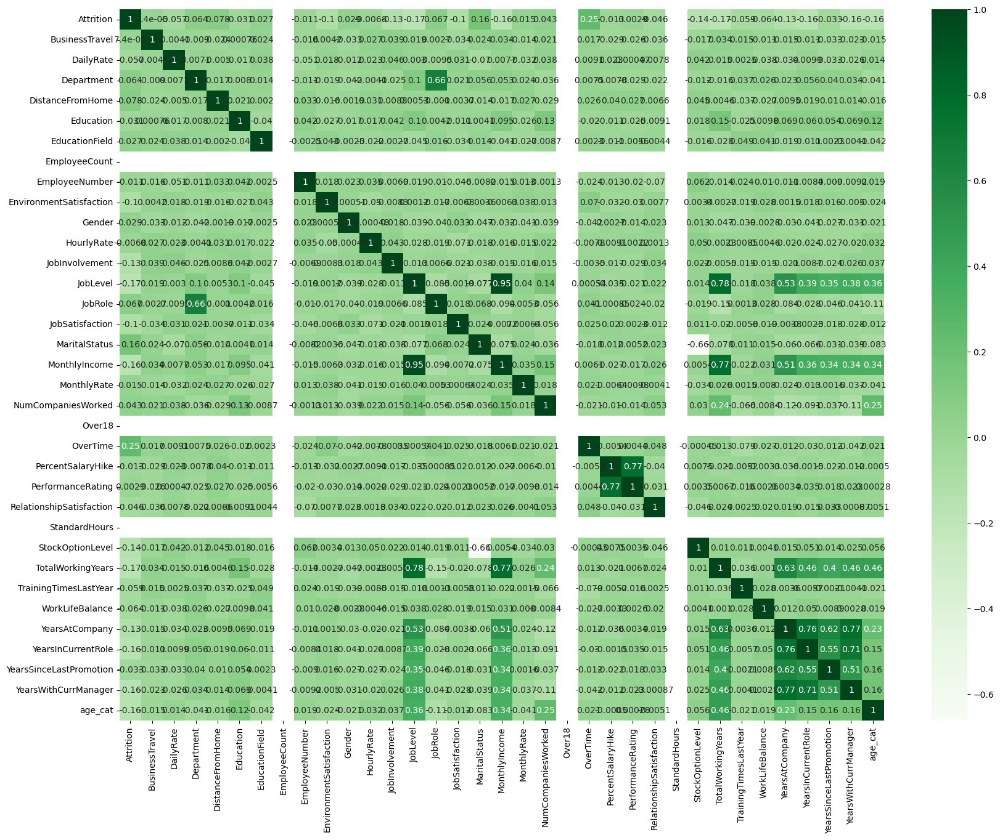

In [268]:
plt.figure(figsize=(20,15))
sns.heatmap(corr,cmap='Greens',annot=True)

Key Observation

It is observed that all the columns correlate with Target Variable Attrition very wellexcept Employee Count, Over 18, Standard Hours.

## Outliers Removal

<AxesSubplot:xlabel='Attrition'>

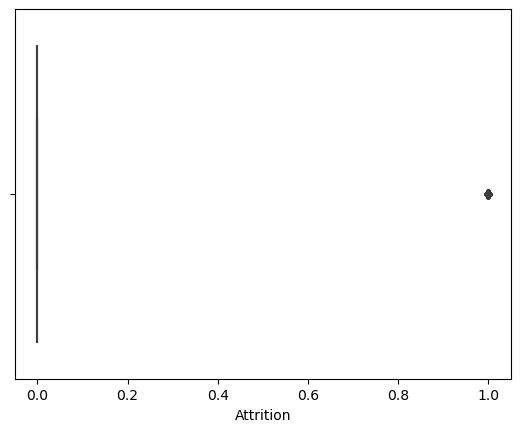

In [116]:
sns.boxplot(df['Attrition'])

<AxesSubplot:xlabel='BusinessTravel'>

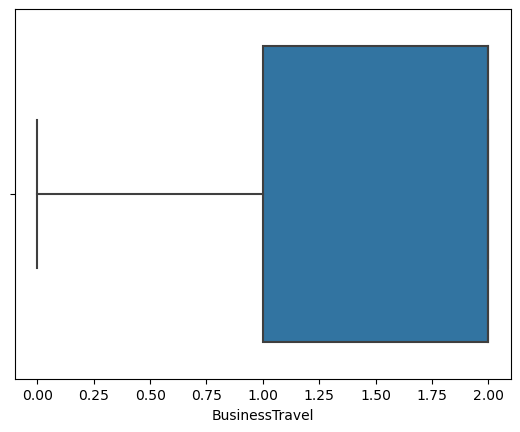

In [118]:
sns.boxplot(df['BusinessTravel'])

<AxesSubplot:xlabel='DailyRate'>

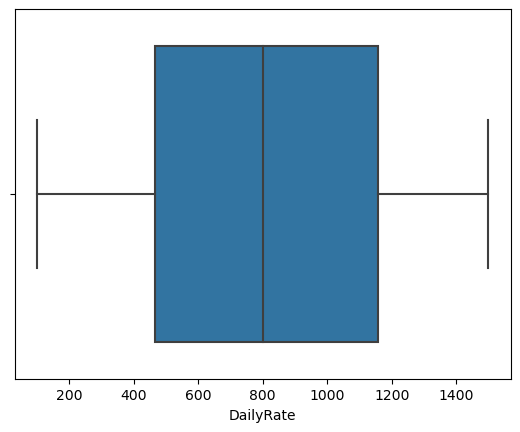

In [119]:
sns.boxplot(df['DailyRate'])

<AxesSubplot:xlabel='Department'>

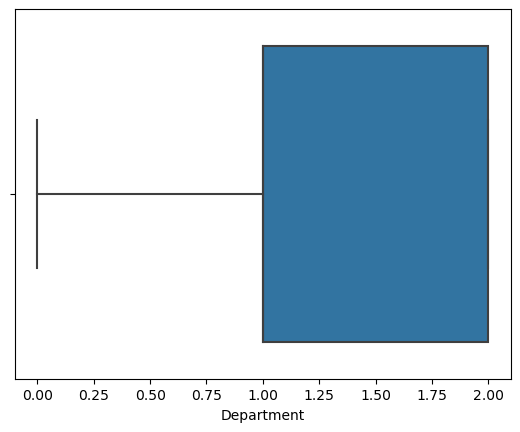

In [120]:
sns.boxplot(df['Department'])

<AxesSubplot:xlabel='DistanceFromHome'>

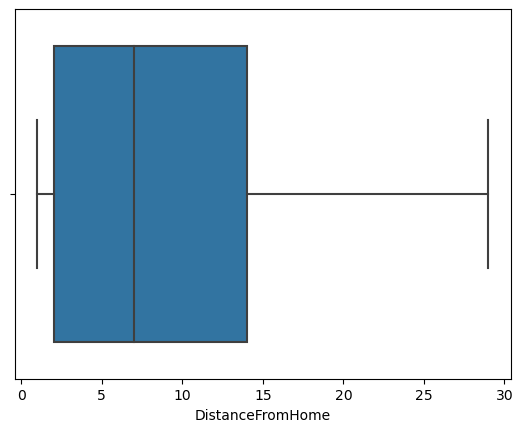

In [121]:
sns.boxplot(df['DistanceFromHome'])

<AxesSubplot:xlabel='Education'>

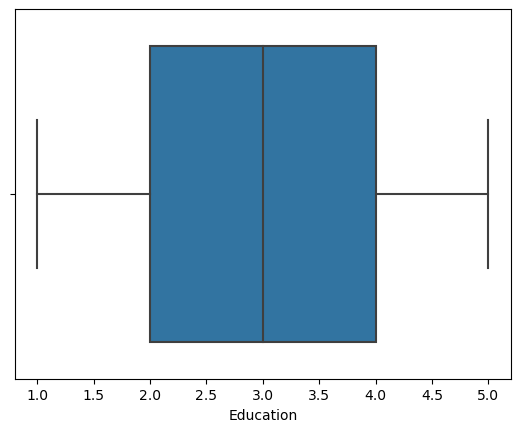

In [122]:
sns.boxplot(df['Education'])

<AxesSubplot:xlabel='EducationField'>

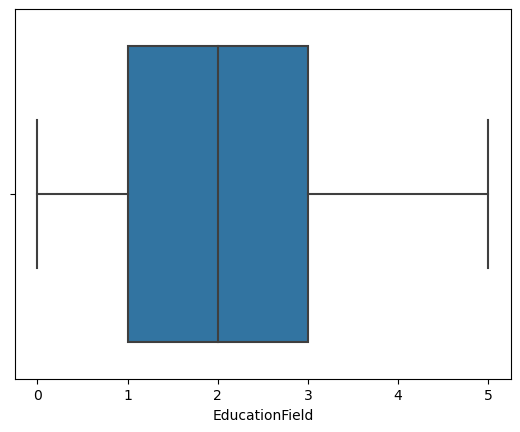

In [126]:
sns.boxplot(df['EducationField'])

<AxesSubplot:xlabel='EmployeeCount'>

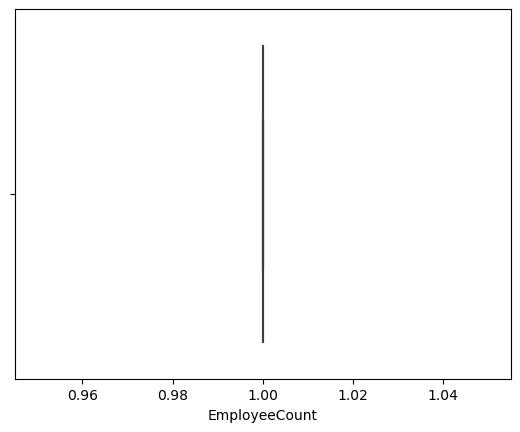

In [127]:
sns.boxplot(df['EmployeeCount'])

<AxesSubplot:xlabel='EmployeeNumber'>

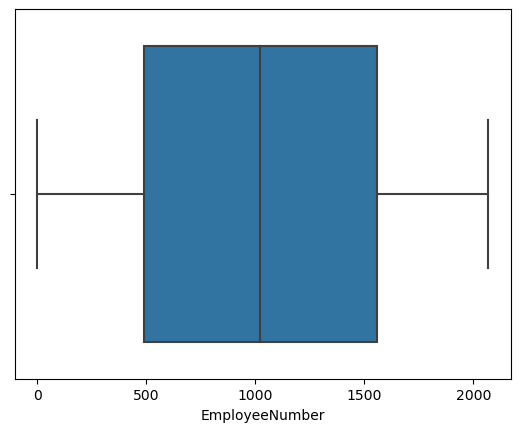

In [128]:
sns.boxplot(df['EmployeeNumber'])

<AxesSubplot:xlabel='EnvironmentSatisfaction'>

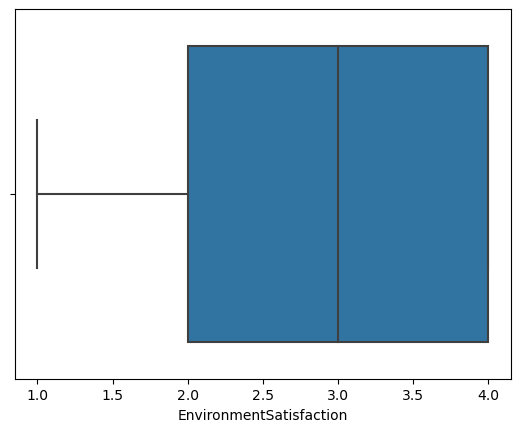

In [129]:
sns.boxplot(df['EnvironmentSatisfaction'])

<AxesSubplot:xlabel='Gender'>

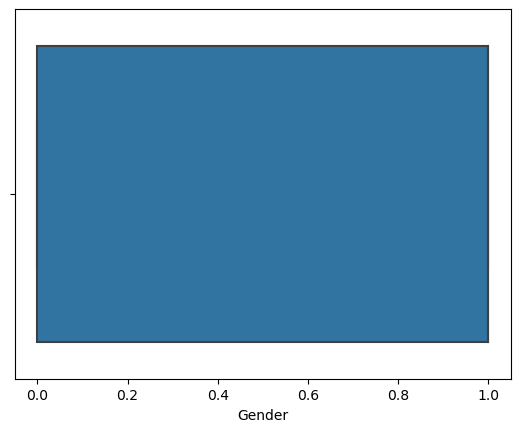

In [130]:
sns.boxplot(df['Gender'])

<AxesSubplot:xlabel='HourlyRate'>

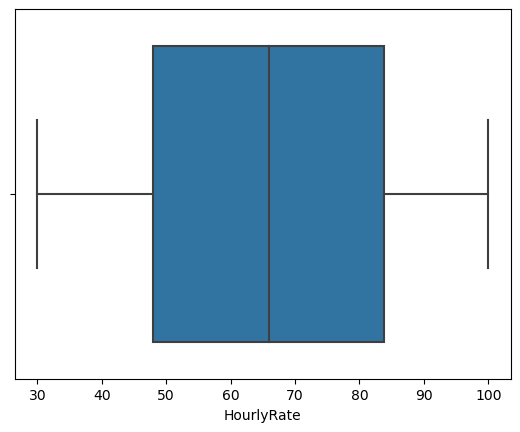

In [131]:
sns.boxplot(df['HourlyRate'])

<AxesSubplot:xlabel='JobInvolvement'>

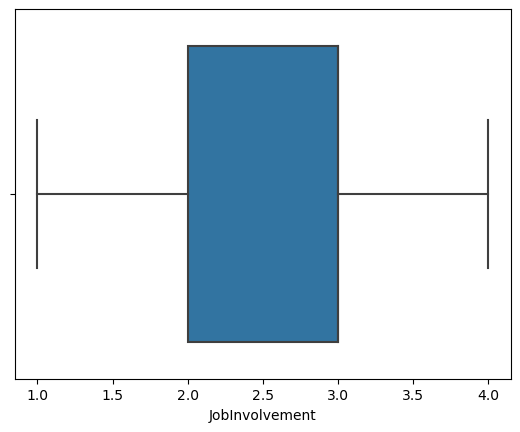

In [132]:
sns.boxplot(df['JobInvolvement'])

<AxesSubplot:xlabel='JobLevel'>

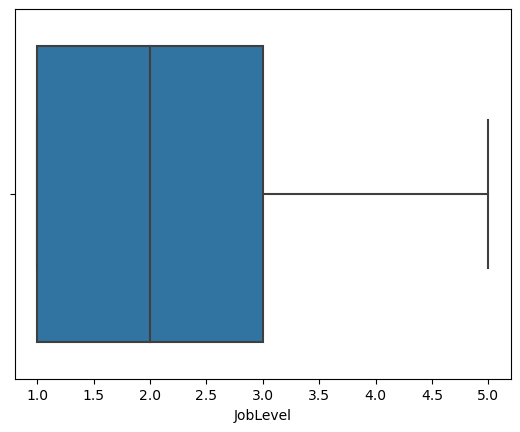

In [133]:
sns.boxplot(df['JobLevel'])

<AxesSubplot:xlabel='JobRole'>

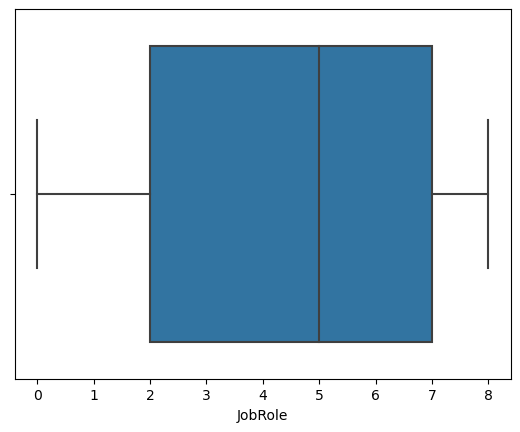

In [134]:
sns.boxplot(df['JobRole'])

<AxesSubplot:xlabel='JobSatisfaction'>

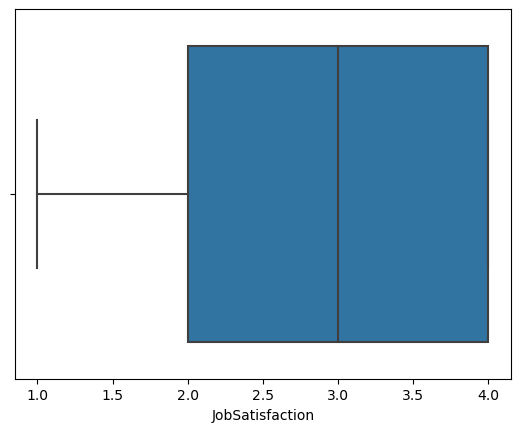

In [135]:
sns.boxplot(df['JobSatisfaction'])

<AxesSubplot:xlabel='MaritalStatus'>

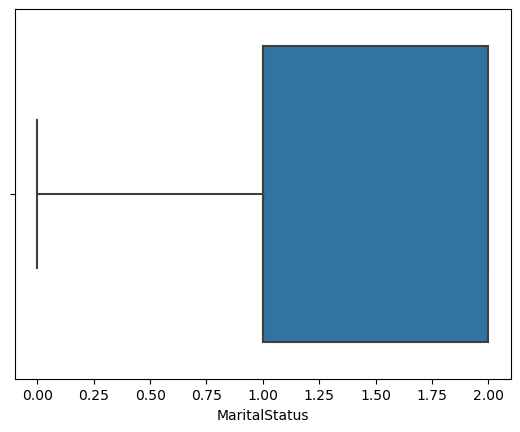

In [136]:
sns.boxplot(df['MaritalStatus'])

<AxesSubplot:xlabel='MonthlyIncome'>

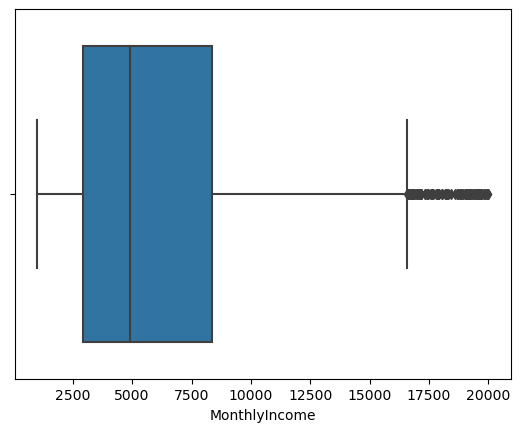

In [137]:
sns.boxplot(df['MonthlyIncome'])

<AxesSubplot:xlabel='NumCompaniesWorked'>

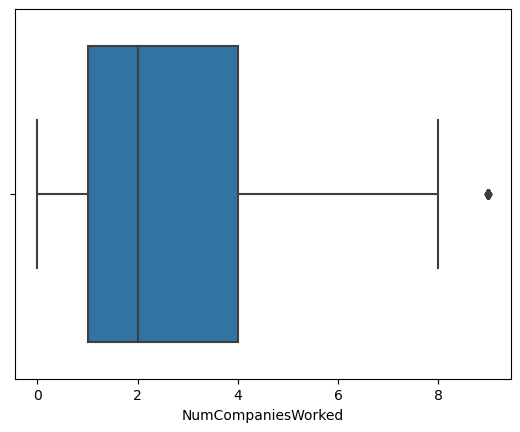

In [138]:
sns.boxplot(df['NumCompaniesWorked'])

<AxesSubplot:xlabel='Over18'>

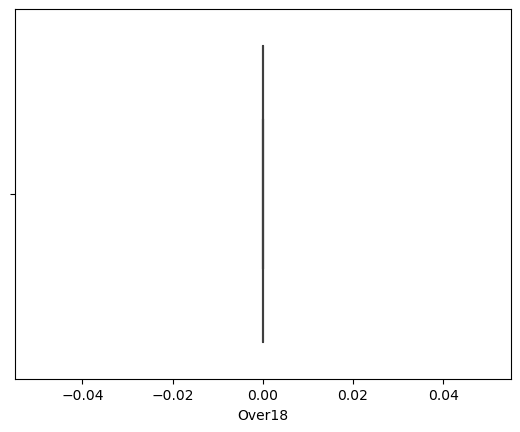

In [139]:
sns.boxplot(df['Over18'])

<AxesSubplot:xlabel='OverTime'>

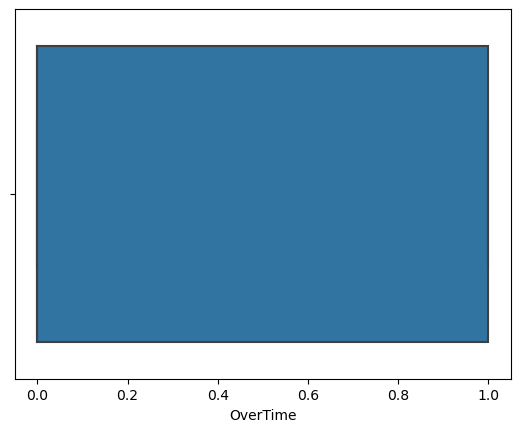

In [140]:
sns.boxplot(df['OverTime'])

<AxesSubplot:xlabel='PercentSalaryHike'>

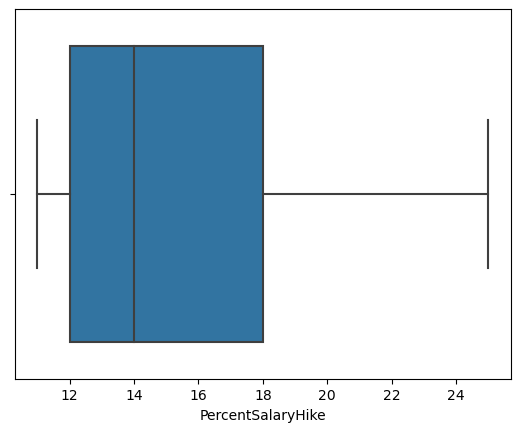

In [141]:
sns.boxplot(df['PercentSalaryHike'])

<AxesSubplot:xlabel='PerformanceRating'>

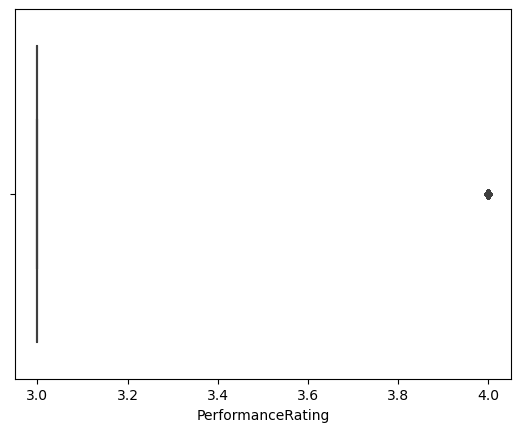

In [142]:
sns.boxplot(df['PerformanceRating'])

<AxesSubplot:xlabel='RelationshipSatisfaction'>

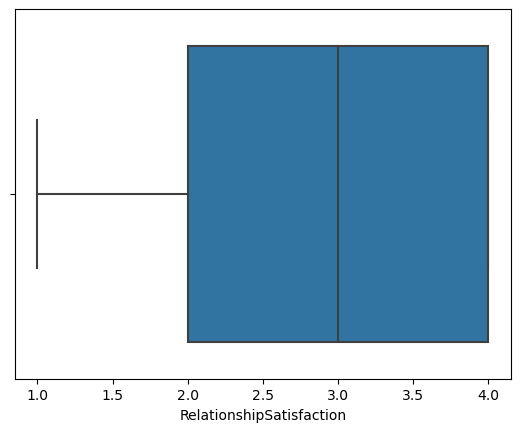

In [143]:
sns.boxplot(df['RelationshipSatisfaction'])

<AxesSubplot:xlabel='StandardHours'>

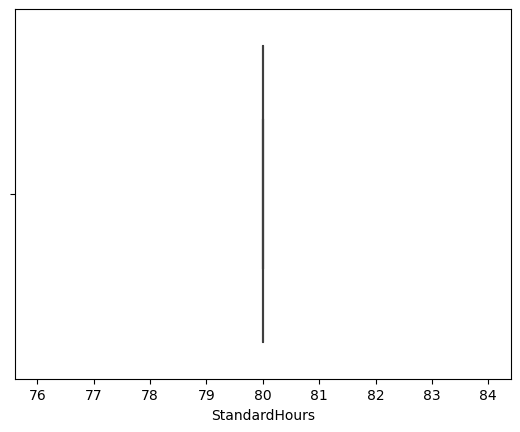

In [144]:
sns.boxplot(df['StandardHours'])

<AxesSubplot:xlabel='StockOptionLevel'>

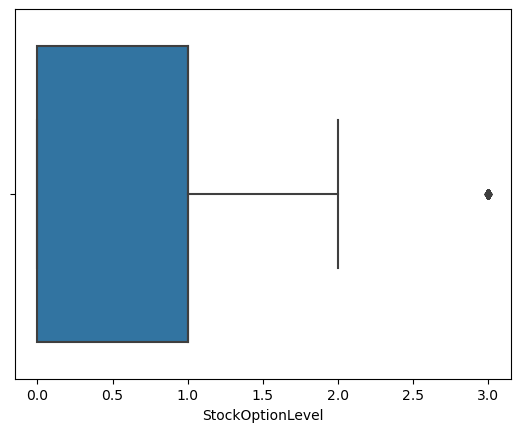

In [145]:
sns.boxplot(df['StockOptionLevel'])

<AxesSubplot:xlabel='TotalWorkingYears'>

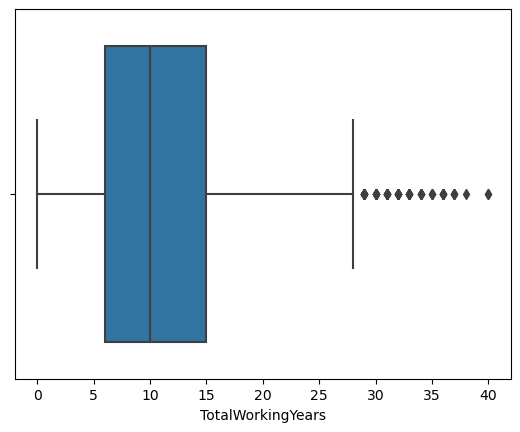

In [146]:
sns.boxplot(df['TotalWorkingYears'])

<AxesSubplot:xlabel='TrainingTimesLastYear'>

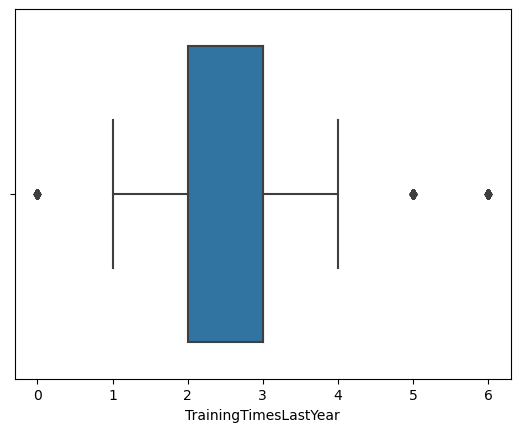

In [147]:
sns.boxplot(df['TrainingTimesLastYear'])

<AxesSubplot:xlabel='WorkLifeBalance'>

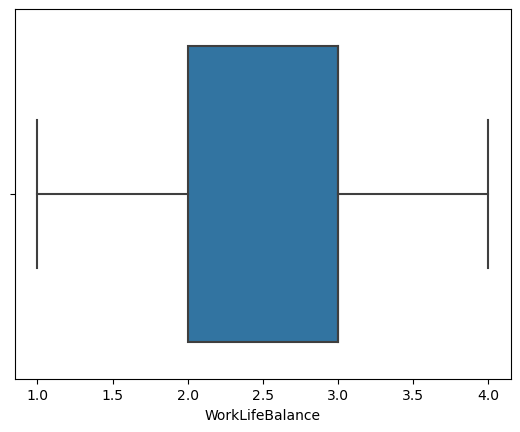

In [148]:
sns.boxplot(df['WorkLifeBalance'])

<AxesSubplot:xlabel='YearsAtCompany'>

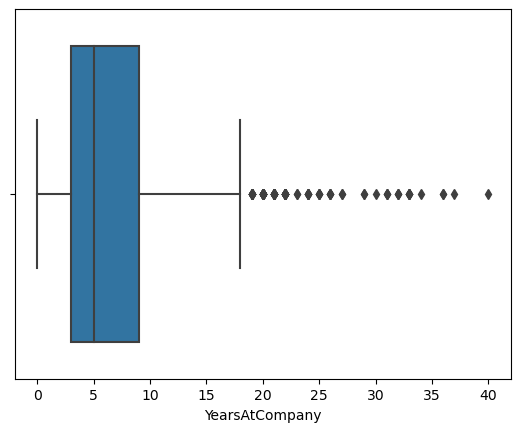

In [149]:
sns.boxplot(df['YearsAtCompany'])

<AxesSubplot:xlabel='YearsInCurrentRole'>

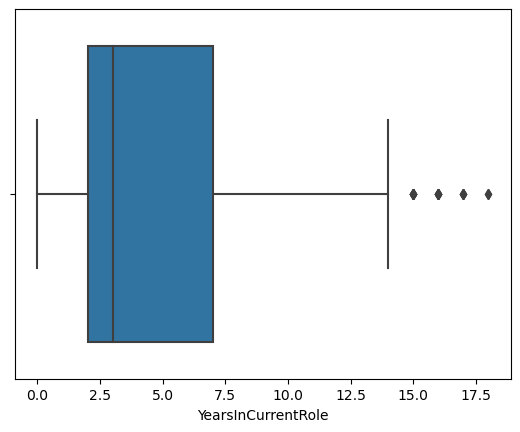

In [150]:
sns.boxplot(df['YearsInCurrentRole'])

<AxesSubplot:xlabel='YearsSinceLastPromotion'>

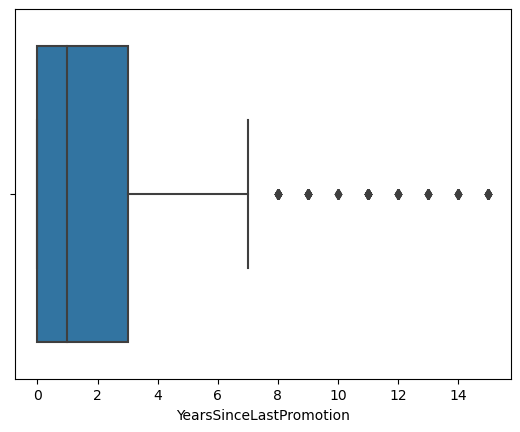

In [151]:
sns.boxplot(df['YearsSinceLastPromotion'])

<AxesSubplot:xlabel='YearsWithCurrManager'>

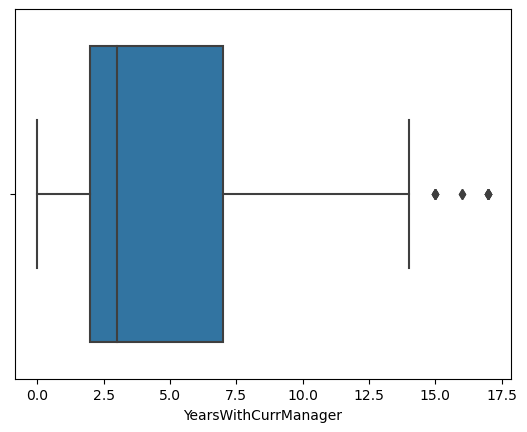

In [152]:
sns.boxplot(df['YearsWithCurrManager'])

<AxesSubplot:xlabel='age_cat'>

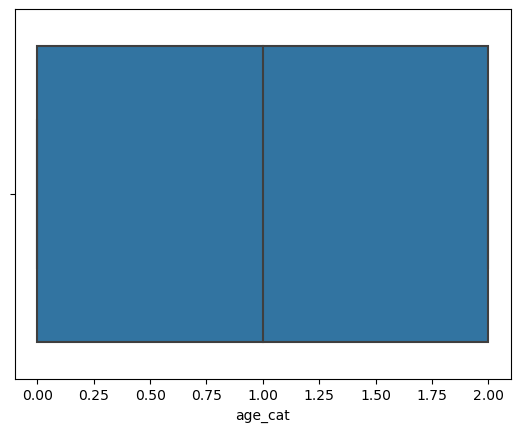

In [153]:
sns.boxplot(df['age_cat'])

## Checking for Skewness

<AxesSubplot:xlabel='BusinessTravel', ylabel='Density'>

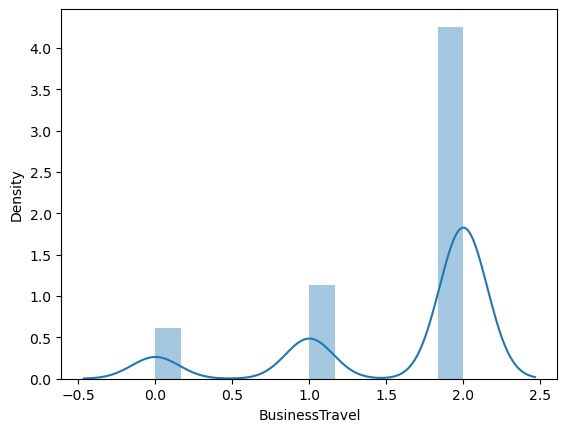

In [155]:
sns.distplot(df['BusinessTravel'])

<AxesSubplot:xlabel='DailyRate', ylabel='Density'>

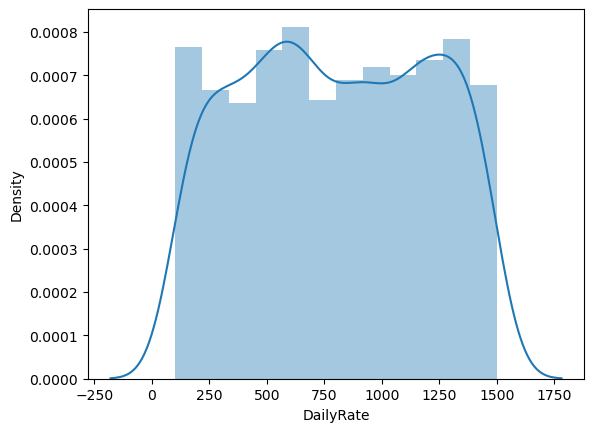

In [156]:
sns.distplot(df['DailyRate'])

<AxesSubplot:xlabel='Department', ylabel='Density'>

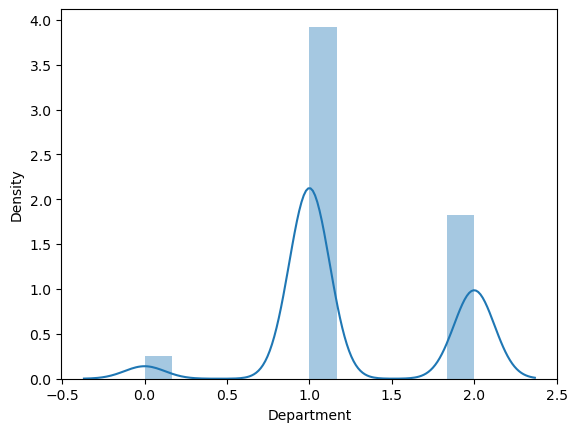

In [157]:
sns.distplot(df['Department'])

<AxesSubplot:xlabel='DistanceFromHome', ylabel='Density'>

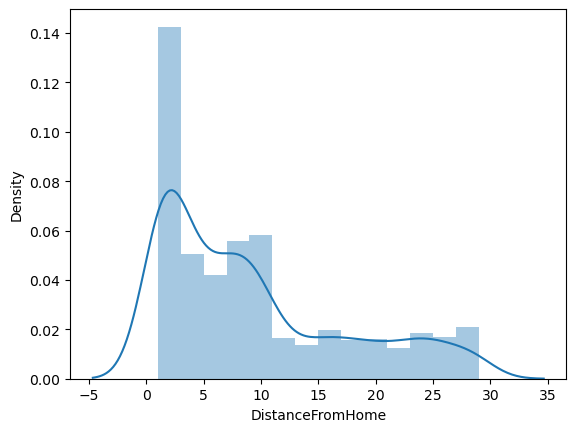

In [158]:
sns.distplot(df['DistanceFromHome'])

<AxesSubplot:xlabel='Education', ylabel='Density'>

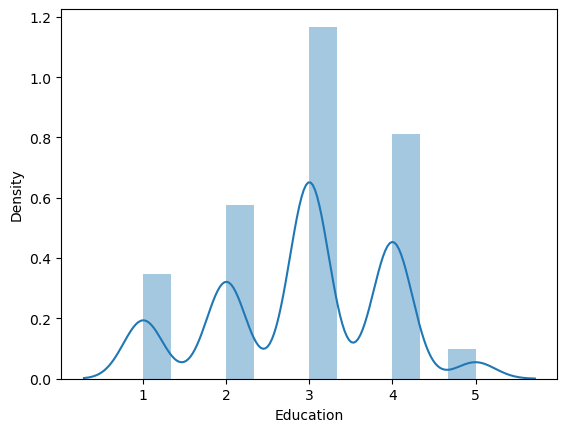

In [159]:
sns.distplot(df['Education'])

<AxesSubplot:xlabel='EducationField', ylabel='Density'>

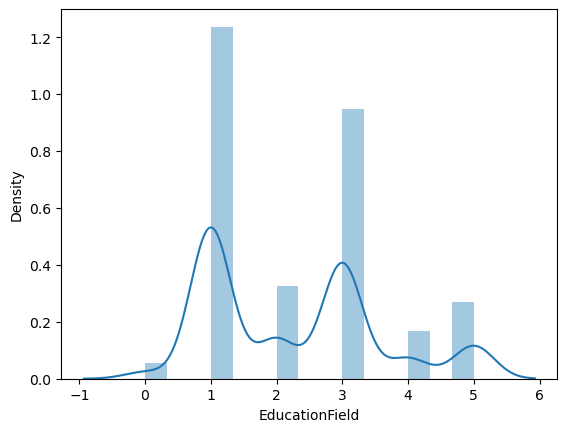

In [160]:
sns.distplot(df['EducationField'])

<AxesSubplot:xlabel='EmployeeCount', ylabel='Density'>

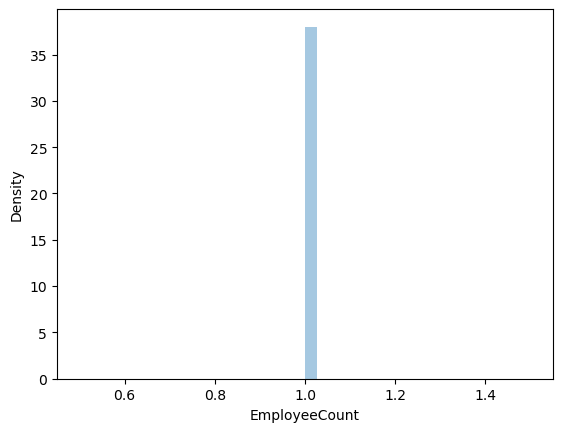

In [161]:
sns.distplot(df['EmployeeCount'])

<AxesSubplot:xlabel='EmployeeNumber', ylabel='Density'>

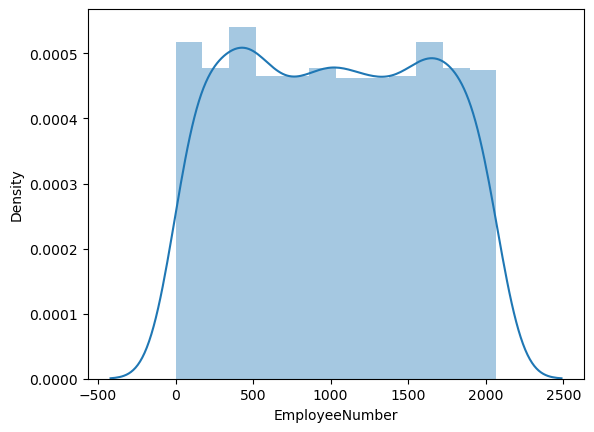

In [162]:
sns.distplot(df['EmployeeNumber'])

<AxesSubplot:xlabel='EnvironmentSatisfaction', ylabel='Density'>

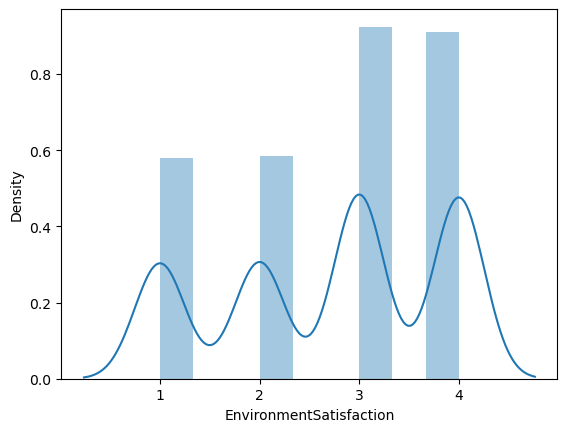

In [163]:
sns.distplot(df['EnvironmentSatisfaction'])

<AxesSubplot:xlabel='Gender', ylabel='Density'>

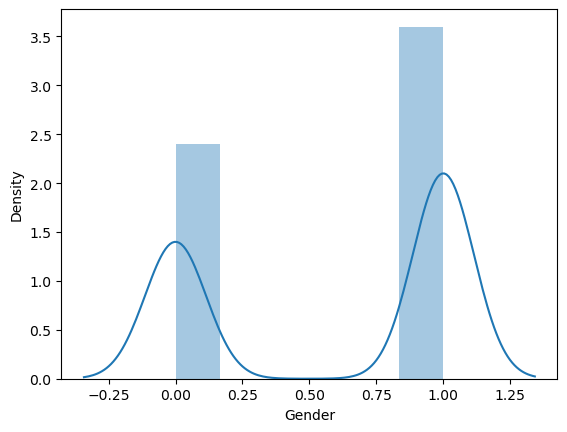

In [164]:
sns.distplot(df['Gender'])

<AxesSubplot:xlabel='HourlyRate', ylabel='Density'>

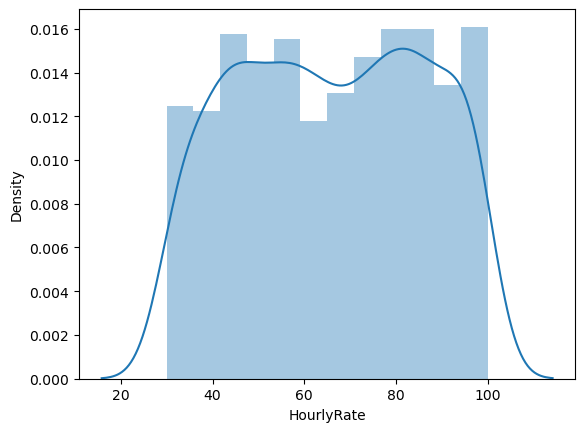

In [165]:
sns.distplot(df['HourlyRate'])

<AxesSubplot:xlabel='JobInvolvement', ylabel='Density'>

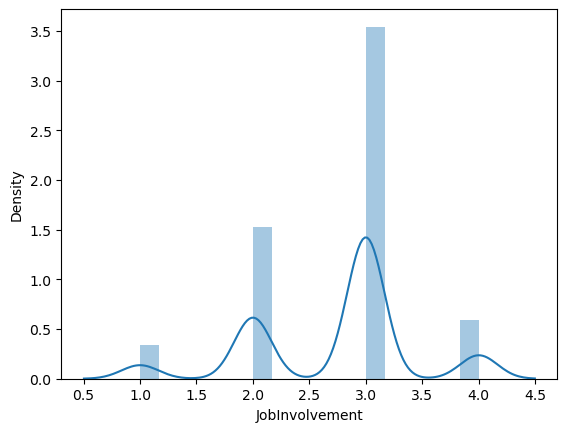

In [166]:
sns.distplot(df['JobInvolvement'])

<AxesSubplot:xlabel='JobLevel', ylabel='Density'>

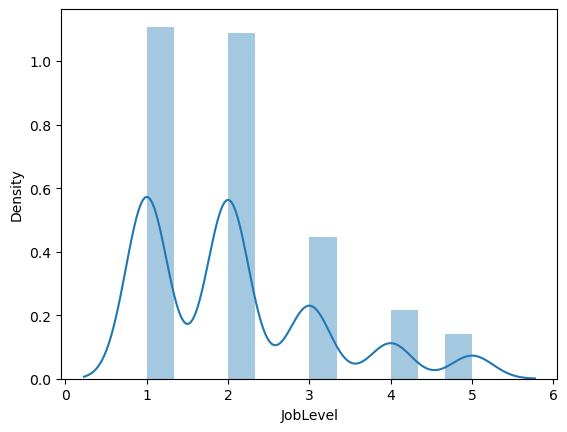

In [167]:
sns.distplot(df['JobLevel'])

<AxesSubplot:xlabel='JobRole', ylabel='Density'>

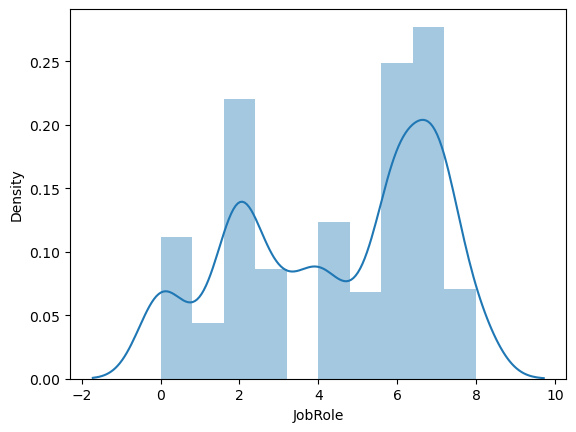

In [168]:
sns.distplot(df['JobRole'])

<AxesSubplot:xlabel='JobSatisfaction', ylabel='Density'>

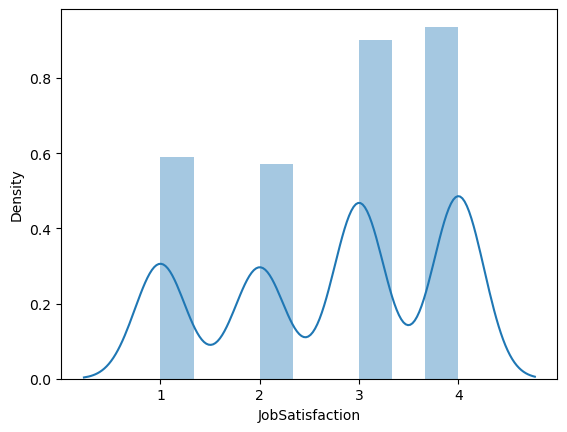

In [169]:
sns.distplot(df['JobSatisfaction'])

<AxesSubplot:xlabel='MaritalStatus', ylabel='Density'>

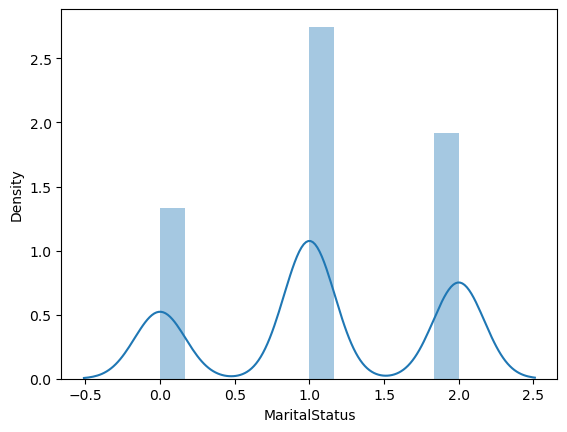

In [170]:
sns.distplot(df['MaritalStatus'])

<AxesSubplot:xlabel='MonthlyIncome', ylabel='Density'>

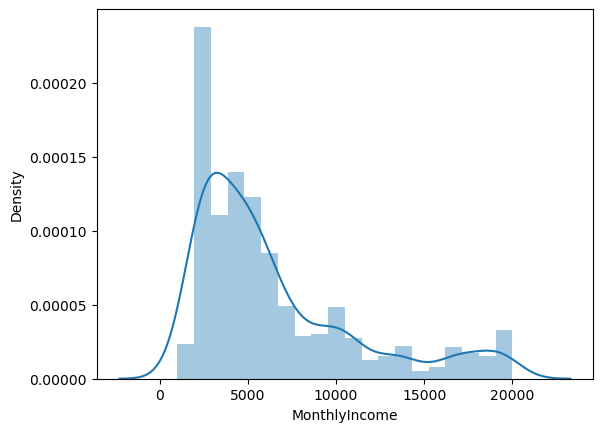

In [171]:
sns.distplot(df['MonthlyIncome'])

<AxesSubplot:xlabel='MonthlyRate', ylabel='Density'>

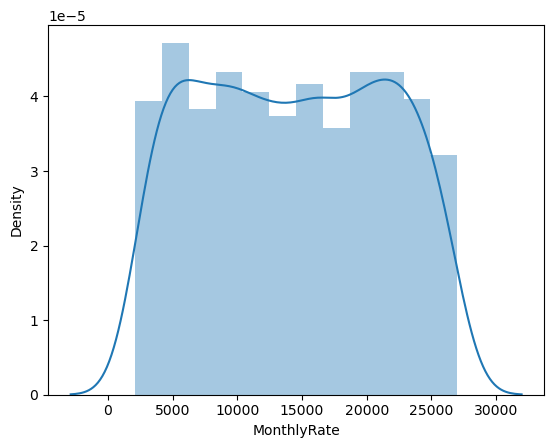

In [172]:
sns.distplot(df['MonthlyRate'])

<AxesSubplot:xlabel='NumCompaniesWorked', ylabel='Density'>

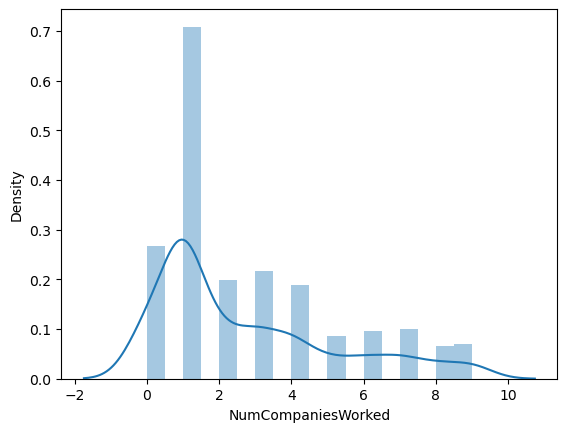

In [173]:
sns.distplot(df['NumCompaniesWorked'])

<AxesSubplot:xlabel='Over18', ylabel='Density'>

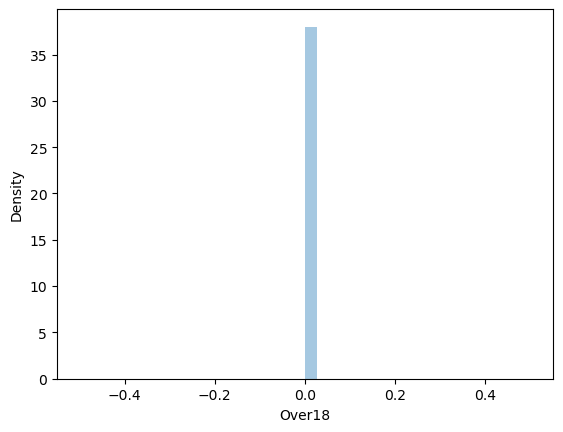

In [174]:
sns.distplot(df['Over18'])

<AxesSubplot:xlabel='OverTime', ylabel='Density'>

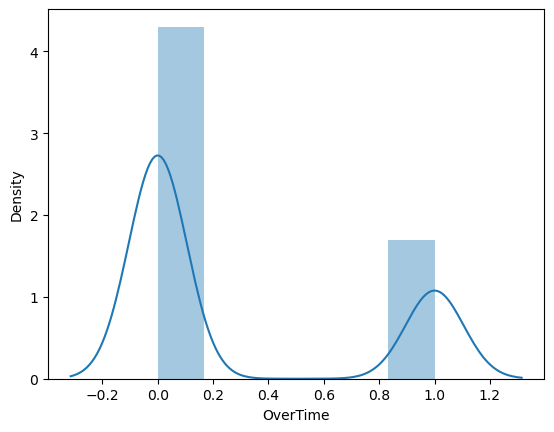

In [175]:
sns.distplot(df['OverTime'])

<AxesSubplot:xlabel='PercentSalaryHike', ylabel='Density'>

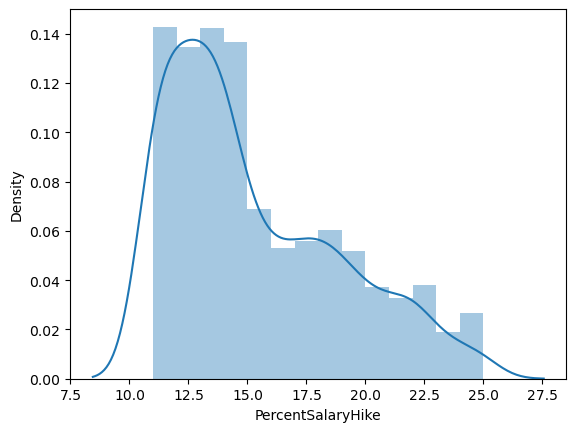

In [176]:
sns.distplot(df['PercentSalaryHike'])

<AxesSubplot:xlabel='PerformanceRating', ylabel='Density'>

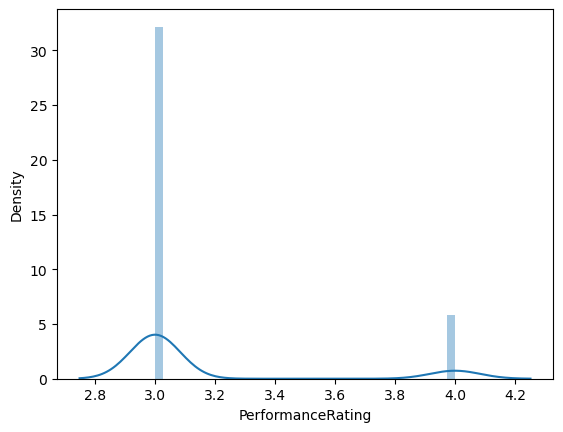

In [177]:
sns.distplot(df['PerformanceRating'])

<AxesSubplot:xlabel='RelationshipSatisfaction', ylabel='Density'>

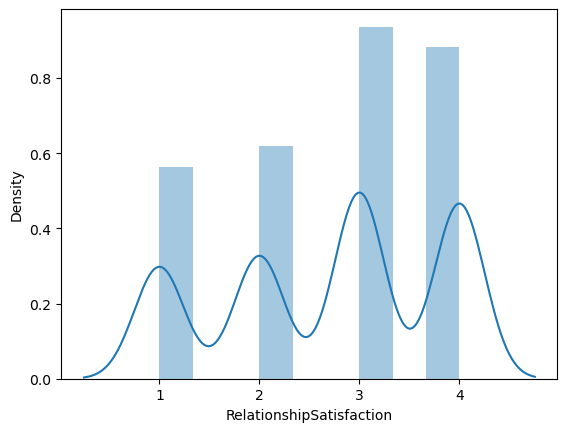

In [178]:
sns.distplot(df['RelationshipSatisfaction'])

<AxesSubplot:xlabel='StandardHours', ylabel='Density'>

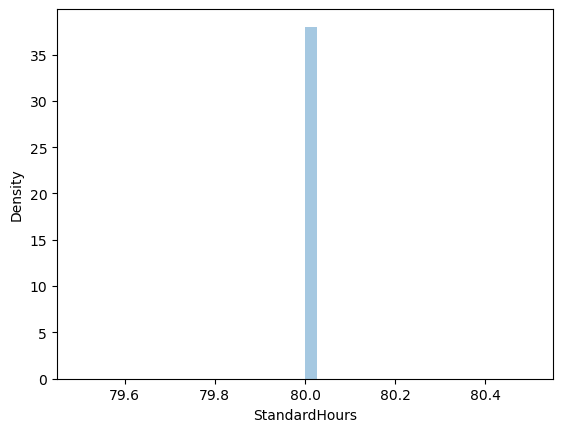

In [179]:
sns.distplot(df['StandardHours'])

<AxesSubplot:xlabel='StockOptionLevel', ylabel='Density'>

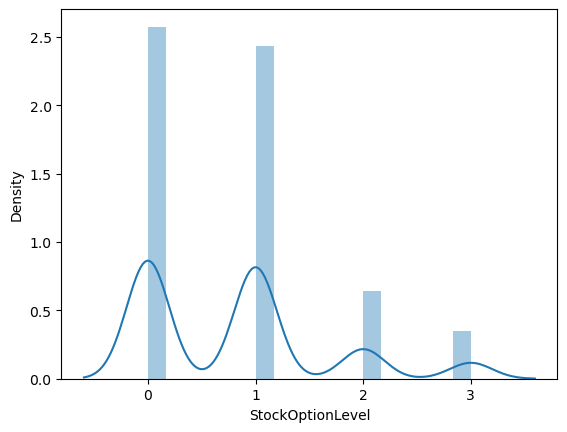

In [180]:
sns.distplot(df['StockOptionLevel'])

<AxesSubplot:xlabel='TotalWorkingYears', ylabel='Density'>

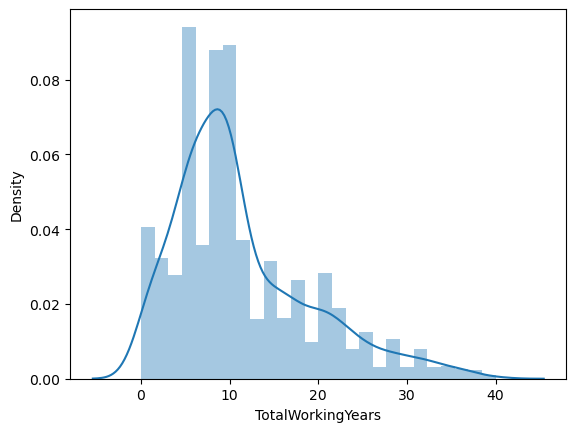

In [181]:
sns.distplot(df['TotalWorkingYears'])

<AxesSubplot:xlabel='TrainingTimesLastYear', ylabel='Density'>

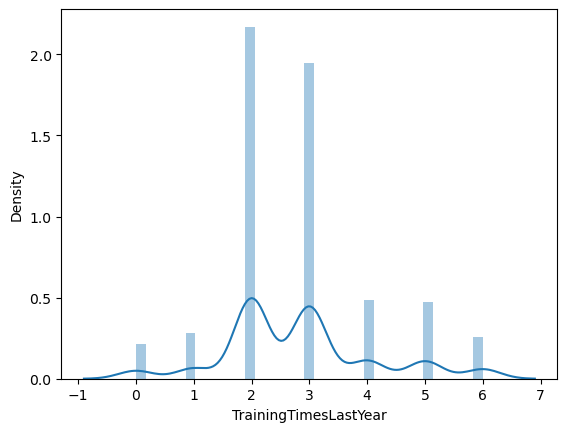

In [182]:
sns.distplot(df['TrainingTimesLastYear'])

<AxesSubplot:xlabel='WorkLifeBalance', ylabel='Density'>

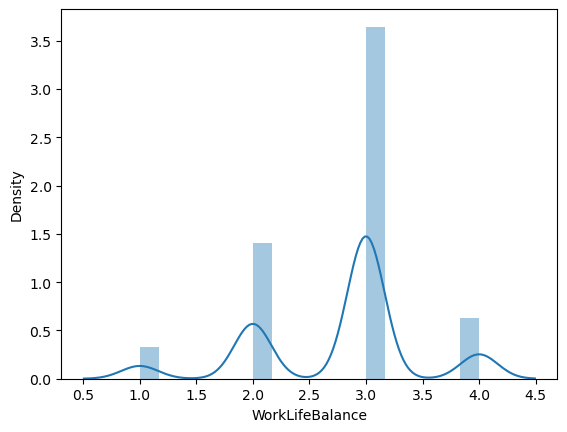

In [183]:
sns.distplot(df['WorkLifeBalance'])

<AxesSubplot:xlabel='YearsAtCompany', ylabel='Density'>

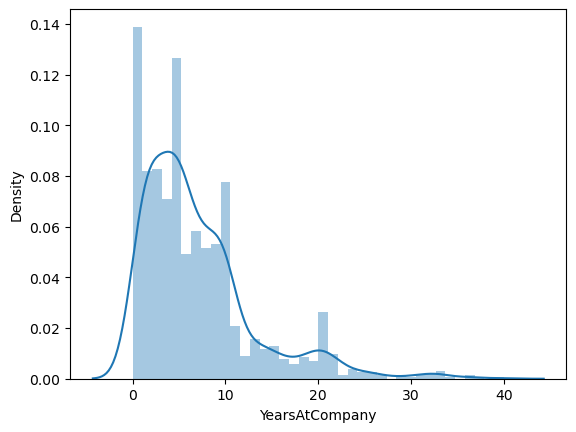

In [184]:
sns.distplot(df['YearsAtCompany'])

<AxesSubplot:xlabel='YearsInCurrentRole', ylabel='Density'>

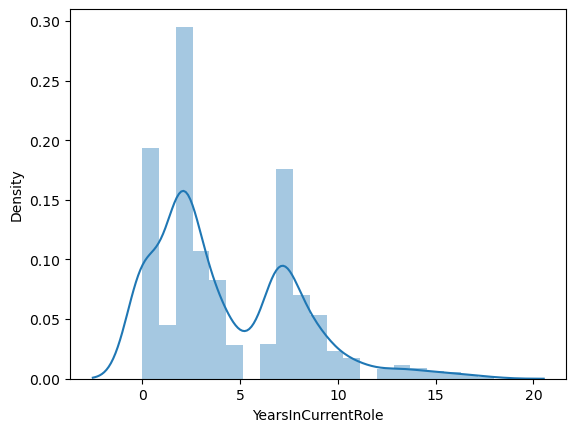

In [185]:
sns.distplot(df['YearsInCurrentRole'])

<AxesSubplot:xlabel='YearsSinceLastPromotion', ylabel='Density'>

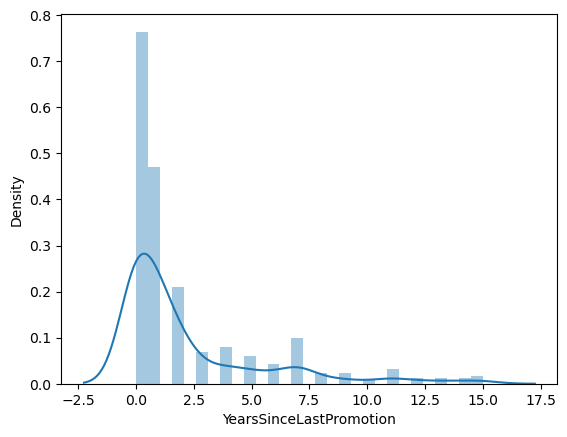

In [186]:
sns.distplot(df['YearsSinceLastPromotion'])

<AxesSubplot:xlabel='YearsWithCurrManager', ylabel='Density'>

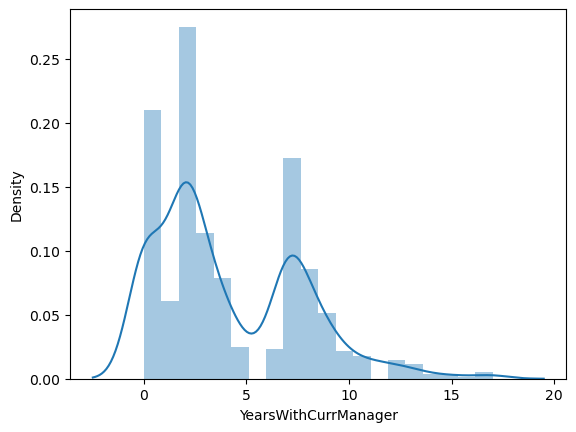

In [187]:
sns.distplot(df['YearsWithCurrManager'])

<AxesSubplot:xlabel='age_cat', ylabel='Density'>

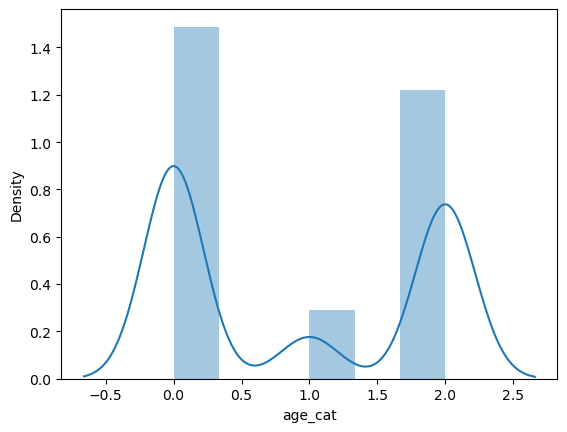

In [188]:
sns.distplot(df['age_cat'])

In [189]:
df.skew()

Attrition                   1.844366
BusinessTravel             -1.439006
DailyRate                  -0.003519
Department                  0.172231
DistanceFromHome            0.958118
Education                  -0.289681
EducationField              0.550371
EmployeeCount               0.000000
EmployeeNumber              0.016574
EnvironmentSatisfaction    -0.321654
Gender                     -0.408665
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    1.025401
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyIncome               1.369817
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
Over18                      0.000000
OverTime                    0.964489
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StandardHours               0.000000
StockOptionLevel            0.968980
T

## Separating Lables and Features

In [190]:
x=df.drop('Attrition',axis=1)
y=df['Attrition']

In [191]:
x

,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,...,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,age_cat
0,2,1102,2,1,2,1,1,1,2,0,...,80,0,8,0,1,6,4,0,5,2
1,1,279,1,8,1,1,1,2,3,1,...,80,1,10,3,3,10,7,1,7,2
2,2,1373,1,2,2,4,1,4,4,1,...,80,0,7,3,3,0,0,0,0,2
3,1,1392,1,3,4,1,1,5,4,0,...,80,0,8,3,3,8,7,3,0,0
4,2,591,1,2,1,3,1,7,1,1,...,80,1,6,3,3,2,2,2,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,1,884,1,23,2,3,1,2061,3,1,...,80,1,17,3,3,5,2,0,3,2
1466,2,613,1,6,1,3,1,2062,4,1,...,80,1,9,5,3,7,7,1,7,2
1467,2,155,1,4,3,1,1,2064,2,1,...,80,1,6,0,3,6,2,0,3,0
1468,1,1023,2,2,3,3,1,2065,4,1,...,80,0,17,3,2,9,6,0,8,2


In [192]:
x.shape

(1470, 34)

In [193]:
y

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1470, dtype: int32

In [194]:
y.shape

(1470,)

### Data Cleaning

#### Removing Outliers

In [195]:
#removing outliers by Z-score method
from scipy.stats import zscore
z=np.abs(zscore(df))
z

,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,age_cat
0,2.280906,0.590048,0.742527,1.401512,1.010909,0.891688,0.937414,NaN,1.701283,0.660531,...,NaN,0.932014,0.421642,2.171982,2.493820,0.164613,0.063296,0.679146,0.245834,1.151373
1,0.438422,0.913194,1.297775,0.493817,0.147150,1.868426,0.937414,NaN,1.699621,0.254625,...,NaN,0.241988,0.164511,0.155707,0.338096,0.488508,0.764998,0.368715,0.806541,1.151373
2,2.280906,0.590048,1.414363,0.493817,0.887515,0.891688,1.316673,NaN,1.696298,1.169781,...,NaN,0.932014,0.550208,0.155707,0.338096,1.144294,1.167687,0.679146,1.155935,1.151373
3,0.438422,0.913194,1.461466,0.493817,0.764121,1.061787,0.937414,NaN,1.694636,1.169781,...,NaN,0.932014,0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,1.155935,0.962953
4,0.438422,0.590048,0.524295,0.493817,0.887515,1.868426,0.565311,NaN,1.691313,1.575686,...,NaN,0.241988,0.678774,0.155707,0.338096,0.817734,0.615492,0.058285,0.595227,0.962953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0.438422,0.913194,0.202082,0.493817,1.703764,0.891688,0.565311,NaN,1.721670,0.254625,...,NaN,0.241988,0.735447,0.155707,0.338096,0.327893,0.615492,0.679146,0.314873,1.151373
1466,0.438422,0.590048,0.469754,0.493817,0.393938,1.868426,0.565311,NaN,1.723332,1.169781,...,NaN,0.241988,0.293077,1.707500,0.338096,0.001333,0.764998,0.368715,0.806541,1.151373
1467,0.438422,0.590048,1.605183,0.493817,0.640727,0.085049,0.937414,NaN,1.726655,0.660531,...,NaN,0.241988,0.678774,2.171982,0.338096,0.164613,0.615492,0.679146,0.314873,0.962953
1468,0.438422,0.913194,0.546677,1.401512,0.887515,0.085049,0.565311,NaN,1.728317,1.169781,...,NaN,0.932014,0.735447,0.155707,1.077862,0.325228,0.488900,0.679146,1.086895,1.151373


In [196]:
df.shape

(1470, 35)

In [197]:
threshold=3
print(np.where(z>3))

(array([  28,   45,   62,   62,   63,   64,   85,   98,   98,  110,  123,
        123,  123,  126,  126,  126,  153,  178,  187,  187,  190,  190,
        218,  231,  231,  237,  237,  270,  270,  281,  326,  386,  386,
        401,  411,  425,  425,  427,  445,  466,  473,  477,  535,  561,
        561,  584,  592,  595,  595,  595,  616,  624,  635,  653,  653,
        677,  686,  701,  716,  746,  749,  752,  799,  838,  861,  861,
        875,  875,  894,  914,  914,  918,  922,  926,  926,  937,  956,
        962,  976,  976, 1008, 1024, 1043, 1078, 1078, 1086, 1086, 1093,
       1111, 1116, 1116, 1135, 1138, 1138, 1156, 1184, 1221, 1223, 1242,
       1295, 1301, 1301, 1303, 1327, 1331, 1348, 1351, 1401, 1414, 1430],
      dtype=int64), array([33, 32, 30, 32, 31, 32, 27, 27, 30, 32, 31, 32, 33, 27, 30, 32, 33,
       32, 27, 33, 30, 31, 32, 31, 33, 30, 32, 27, 30, 31, 32, 32, 33, 27,
       30, 30, 32, 32, 27, 31, 30, 30, 32, 30, 33, 32, 30, 27, 30, 32, 33,
       27, 33, 30, 32, 

In [198]:
df[(z<3)]

,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,age_cat
0,1,2,1102,2,1,2,1,NaN,1,2,...,NaN,0,8.0,0,1,6.0,4.0,0.0,5.0,2
1,0,1,279,1,8,1,1,NaN,2,3,...,NaN,1,10.0,3,3,10.0,7.0,1.0,7.0,2
2,1,2,1373,1,2,2,4,NaN,4,4,...,NaN,0,7.0,3,3,0.0,0.0,0.0,0.0,2
3,0,1,1392,1,3,4,1,NaN,5,4,...,NaN,0,8.0,3,3,8.0,7.0,3.0,0.0,0
4,0,2,591,1,2,1,3,NaN,7,1,...,NaN,1,6.0,3,3,2.0,2.0,2.0,2.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,884,1,23,2,3,NaN,2061,3,...,NaN,1,17.0,3,3,5.0,2.0,0.0,3.0,2
1466,0,2,613,1,6,1,3,NaN,2062,4,...,NaN,1,9.0,5,3,7.0,7.0,1.0,7.0,2
1467,0,2,155,1,4,3,1,NaN,2064,2,...,NaN,1,6.0,0,3,6.0,2.0,0.0,3.0,0
1468,0,1,1023,2,2,3,3,NaN,2065,4,...,NaN,0,17.0,3,2,9.0,6.0,0.0,8.0,2


In [199]:
df.shape

(1470, 35)

### Removing Skewness

In [200]:
x.skew()

BusinessTravel             -1.439006
DailyRate                  -0.003519
Department                  0.172231
DistanceFromHome            0.958118
Education                  -0.289681
EducationField              0.550371
EmployeeCount               0.000000
EmployeeNumber              0.016574
EnvironmentSatisfaction    -0.321654
Gender                     -0.408665
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    1.025401
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyIncome               1.369817
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
Over18                      0.000000
OverTime                    0.964489
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StandardHours               0.000000
StockOptionLevel            0.968980
TotalWorkingYears           1.117172
T

Columns DistanceFromHome, JobLevel, MonthlyIncome, NumCompaniesWorked, OverTime, PerformanceRating, StockOptionLevel, TotalWorkingYears, YearsAtCompany, YearsInCurrentRole,YearsSinceLastPromotion, YearsWithCurrManager has some skewness present in them we will remove them using various methods               

In [206]:
#finding the best method to remove skewness
from scipy.stats import skew,boxcox
from scipy import stats
def skee(a):
    model=[np.sqrt(a),np.log(a),stats.boxcox(a)[0]]
    print('Original skewness was: ',a.skew())
    print('\n')
    for m in model:
        x=m
        print(skew(m))
        print('\n')

In [209]:
skee(x['DistanceFromHome'])

Original skewness was:  -0.029120785364396513


-0.3101455602632375


-0.6015010965945174


-0.16496079245077935




In [212]:
skee(x['JobLevel'])

Original skewness was:  0.4481334349835919


0.23605414089203797


0.052096679611447615


0.015490465381414475




In [213]:
x['JobLevel']=stats.boxcox(x['JobLevel'])[0]

In [214]:
skee(x['MonthlyIncome'])

Original skewness was:  0.2864483763069351


0.21461275632329513


0.1415713744737137


0.01474271072583566




In [216]:
x['MonthlyIncome']=stats.boxcox(x['MonthlyIncome'])[0]

In [220]:
skee(x['PercentSalaryHike'])

Original skewness was:  0.5135425214775441


0.4604006529594951


0.4081630032069026


0.09124347895792163




In [221]:
x['PercentSalaryHike']=stats.boxcox(x['PercentSalaryHike'])[0]

In [222]:
skee(x['PerformanceRating'])

Original skewness was:  1.9218827021425997


1.9199210412109649


1.91992104121095


1.9199210417655215




In [230]:
x.skew()

BusinessTravel             -1.815861
DailyRate                  -0.003519
Department                  0.172231
DistanceFromHome           -0.165129
Education                  -0.289681
EducationField             -0.054786
EmployeeCount               0.000000
EmployeeNumber              0.016574
EnvironmentSatisfaction    -0.321654
Gender                     -0.408665
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    0.015506
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyIncome               0.014758
MonthlyRate                 0.018578
NumCompaniesWorked          0.092896
Over18                      0.000000
OverTime                    0.964489
PercentSalaryHike           0.091337
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StandardHours               0.000000
StockOptionLevel            0.271963
TotalWorkingYears          -0.622175
T

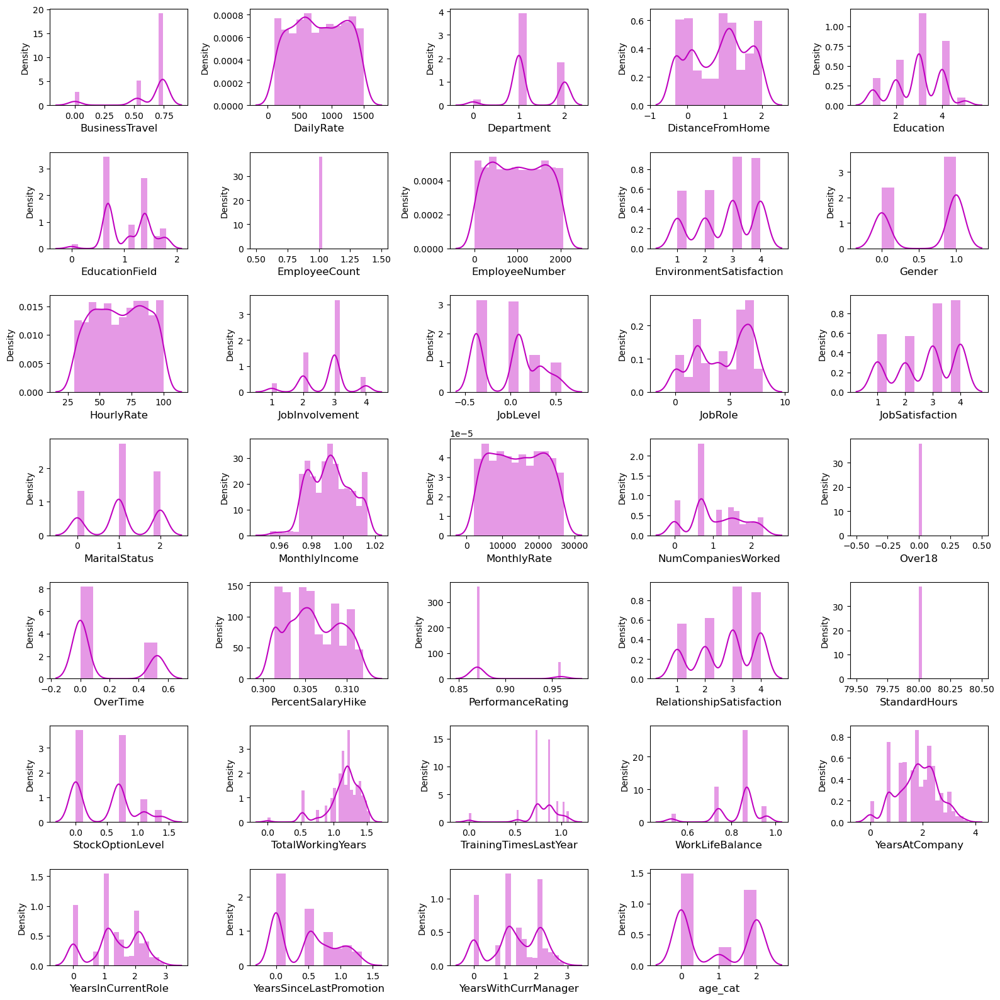

In [234]:
plt.figure(figsize=(16,16))
plotnumber=1
for i in x.columns:
    if plotnumber<=34:
        ax=plt.subplot(7,5,plotnumber)
        sns.distplot(x[i],color='m')
        plt.xlabel(i,fontsize=12)
        plt.yticks(rotation=0,fontsize=10)
    plotnumber+=1
plt.tight_layout()

Now after remvoing skewness our graph looks decent

## Spliting the data for training and testing

In [235]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=43)

In [236]:
x_train.shape

(1176, 34)

In [237]:
x_test.shape

(294, 34)

In [238]:
y_train.shape

(1176,)

In [239]:
y_test.shape

(294,)

## Feature Scalling

In [240]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

In [246]:
# Fit the scaler to the training data
scaler.fit(x_train)

StandardScaler()

In [247]:
# Transform the training and testing data
x_train_scaled=scaler.transform(x_train)
x_test_scaled=scaler.transform(x_test)

In [241]:
y.value_counts()

0    1233
1     237
Name: Attrition, dtype: int64

it seems our target varibale has imbalance dataset. we can balance it using SMOTE technique

## Oversampling

In [242]:
from imblearn.over_sampling import SMOTE
SM=SMOTE()
x,y=SM.fit_resample(x,y)

In [243]:
y.value_counts()

1    1233
0    1233
Name: Attrition, dtype: int64

Now our target variable is balanced

## Modelling

### Finding the best random state

In [244]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

maxAccu=0
maxRS=0

for i in range(1,1000):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    RFR=RandomForestClassifier()
    RFR.fit(x_train,y_train)
    pred=RFR.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
        
print('Best accuracy is',maxAccu,'at random_state',maxRS)

Best accuracy is 0.9655870445344129 at random_state 811


We got the Best Accuracy of 96%, at random_state 811 

In [245]:
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier,GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier


In [246]:
et=ExtraTreesClassifier()
gb=GradientBoostingClassifier()
add=AdaBoostClassifier()
bc=BaggingClassifier()
lr=LogisticRegression()
svc=SVC
gnb=GaussianNB()
knn=KNeighborsClassifier()
dtc=DecisionTreeClassifier()
rf=RandomForestClassifier()

In [250]:
print('Accuracy score, Confusion Matrix and Classification report for different Models')
print('\n')
models=[et,gb,add,bc,lr,gnb,knn,dtc,rf]
best_accuracy=0
best_model=None
for m in models:
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=811)
    m.fit(x_train,y_train)
    pred=m.predict(x_test)
    
    
    #Evaluate the model
    accuracy=accuracy_score(y_test,pred)
    print('Accuracy score of',m)
    print(round((accuracy_score(y_test,pred)),3))
    print('Confusion Matrix of',m)
    print(confusion_matrix(y_test,pred))
    print('Classification Report of',m)
    print(classification_report(y_test,pred))
    print('\n')
    
    if accuracy>best_accuracy:
        best_model=m
        best_accuracy=accuracy
        best_pred=pred
        
print('\nBest Performing Model:',best_model)
print('Accuracy Score:',round(best_accuracy,3))

Accuracy score, Confusion Matrix and Classification report for different Models


Accuracy score of ExtraTreesClassifier()
0.97
Confusion Matrix of ExtraTreesClassifier()
[[257   7]
 [  8 222]]
Classification Report of ExtraTreesClassifier()
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       264
           1       0.97      0.97      0.97       230

    accuracy                           0.97       494
   macro avg       0.97      0.97      0.97       494
weighted avg       0.97      0.97      0.97       494



Accuracy score of GradientBoostingClassifier()
0.951
Confusion Matrix of GradientBoostingClassifier()
[[257   7]
 [ 17 213]]
Classification Report of GradientBoostingClassifier()
              precision    recall  f1-score   support

           0       0.94      0.97      0.96       264
           1       0.97      0.93      0.95       230

    accuracy                           0.95       494
   macro avg       0.95      0.9

## Cross Validation Score

In [252]:
from sklearn.model_selection import cross_val_score
models=[et,gb,add,bc,lr,gnb,knn,dtc,rf]
for m in models:
    score=cross_val_score(m,x,y,cv=5)
    print(m,'Cross Validation score is:')
    print(round(score.mean(),3))
    
    m.fit(x_train,y_train)
    pred=m.predict(x_test)
    print('Difference between Accuracy and cross validation score is:',round(accuracy_score(y_test,pred)-score.mean(),3))
    print('\n')

ExtraTreesClassifier() Cross Validation score is:
0.923
Difference between Accuracy and cross validation score is: 0.042


GradientBoostingClassifier() Cross Validation score is:
0.711
Difference between Accuracy and cross validation score is: 0.24


AdaBoostClassifier() Cross Validation score is:
0.669
Difference between Accuracy and cross validation score is: 0.228


BaggingClassifier() Cross Validation score is:
0.707
Difference between Accuracy and cross validation score is: 0.212


LogisticRegression() Cross Validation score is:
0.737
Difference between Accuracy and cross validation score is: 0.05


GaussianNB() Cross Validation score is:
0.76
Difference between Accuracy and cross validation score is: 0.048


KNeighborsClassifier() Cross Validation score is:
0.619
Difference between Accuracy and cross validation score is: 0.085


DecisionTreeClassifier() Cross Validation score is:
0.647
Difference between Accuracy and cross validation score is: 0.226


RandomForestClassifier() Cro

SO The best performing model is ExtraTree Classifier as the diffenence between accuracy score and cv score calculated on accuracy is is least.

### ExtraTree Classifier is our best model

## Hyper Parameter Tuning

In [253]:
# ExtraTree Classifier
from sklearn.model_selection import GridSearchCV

parameters={'criterion':['gini','entropy'],
            'random_state':[10,50,1000],
            'max_depth':[0,10,20],
            'n_jobs':[-2,-1,1],
            'n_estimators':[50,100,200,300]}

In [254]:
GCV=GridSearchCV(ExtraTreesClassifier(),parameters,cv=5)

In [255]:
GCV.fit(x_train,y_train)

exception calling callback for <Future at 0x2043d258a90 state=finished raised ValueError>
Traceback (most recent call last):
  File "C:\Users\23ady\anaconda3\lib\site-packages\joblib\externals\loky\_base.py", line 26, in _invoke_callbacks
    callback(self)
  File "C:\Users\23ady\anaconda3\lib\site-packages\joblib\parallel.py", line 385, in __call__
    self.parallel.dispatch_next()
  File "C:\Users\23ady\anaconda3\lib\site-packages\joblib\parallel.py", line 834, in dispatch_next
    if not self.dispatch_one_batch(self._original_iterator):
  File "C:\Users\23ady\anaconda3\lib\site-packages\joblib\parallel.py", line 901, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\23ady\anaconda3\lib\site-packages\joblib\parallel.py", line 819, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "C:\Users\23ady\anaconda3\lib\site-packages\joblib\_parallel_backends.py", line 556, in apply_async
    future = self._workers.submit(SafeFunction(func))
  File "C:\U

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1],
                         'random_state': [10, 50, 1000]})

In [256]:
GCV.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'n_estimators': 300,
 'n_jobs': -2,
 'random_state': 50}

In [258]:
Final_model=ExtraTreesClassifier(criterion='gini',max_depth= 20,n_estimators=300,n_jobs=-2,random_state=50)
Final_model.fit(x_train,y_train)
pred=Final_model.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

95.95141700404858


## Plotting ROC and compare AUC for all the models used

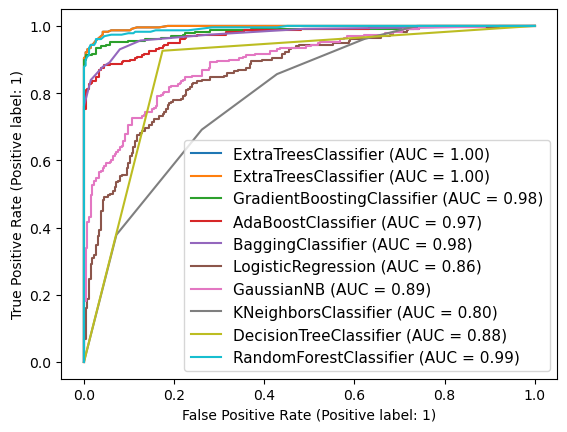

In [260]:
#Plotting for all the models used here
from sklearn import datasets
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve

disp=plot_roc_curve(et,x_test,y_test)
plot_roc_curve(et,x_test,y_test,ax=disp.ax_)
plot_roc_curve(gb,x_test,y_test,ax=disp.ax_)
plot_roc_curve(add,x_test,y_test,ax=disp.ax_)
plot_roc_curve(bc,x_test,y_test,ax=disp.ax_)
plot_roc_curve(lr,x_test,y_test,ax=disp.ax_)
plot_roc_curve(gnb,x_test,y_test,ax=disp.ax_)
plot_roc_curve(knn,x_test,y_test,ax=disp.ax_)
plot_roc_curve(dtc,x_test,y_test,ax=disp.ax_)
plot_roc_curve(rf,x_test,y_test,ax=disp.ax_)

plt.legend(prop={'size':11},loc='lower right')
plt.show()

In [262]:
a =np.array(y_test)
predicted=np.array(rf.predict(x_test))
wine=pd.DataFrame({'Orginal':a,'Predicted':predicted}, index=range(len(a)))
wine

,Orginal,Predicted
0,0,0
1,1,1
2,0,0
3,0,0
4,1,1
...,...,...
489,1,1
490,0,0
491,0,0
492,1,1


In [261]:
#Since the Model without Outliers performing best! We will select that DataFrame.
#Saving the Model
import pickle
filename='hr_attrition_rate.pickle'
pickle.dump(et,open(filename,'wb'))
loaded_model = pickle.load(open(filename, 'rb'))
loaded_model.predict(x_test)

array([0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0,
       1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0,
       1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1,
       0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1,
       1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1,